# Import

## Import reqired libraries

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import math
import graphviz
from dtreeviz.trees import dtreeviz
import xgboost as xgb
from sklearn.model_selection import GridSearchCV 
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier, export_graphviz
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, plot_confusion_matrix, roc_curve, auc
from sklearn.metrics import classification_report
import statsmodels.api as sm
from sklearn import svm
from sklearn.model_selection import train_test_split
from tabulate import tabulate
from sklego.meta import ZeroInflatedRegressor
from scipy import stats
import warnings
warnings.filterwarnings('ignore')
#%matplotlib inline

## Import data file

Import the file and have a look on the data.

In [2]:
df = pd.read_csv(r'concrete_data.csv')
df.head(5)

,Cement,Blast Furnace Slag,Fly Ash,Water,Superplasticizer,Coarse Aggregate,Fine Aggregate,Age,Strength
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.99
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.89
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,40.27
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365,41.05
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360,44.30


In [3]:
print(f"The shape of the data is: {df.shape}")
df.info()

The shape of the data is: (1030, 9)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1030 entries, 0 to 1029
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Cement              1030 non-null   float64
 1   Blast Furnace Slag  1030 non-null   float64
 2   Fly Ash             1030 non-null   float64
 3   Water               1030 non-null   float64
 4   Superplasticizer    1030 non-null   float64
 5   Coarse Aggregate    1030 non-null   float64
 6   Fine Aggregate      1030 non-null   float64
 7   Age                 1030 non-null   int64  
 8   Strength            1030 non-null   float64
dtypes: float64(8), int64(1)
memory usage: 72.5 KB


In [4]:
df_summary = df.describe()
df_summary

,Cement,Blast Furnace Slag,Fly Ash,Water,Superplasticizer,Coarse Aggregate,Fine Aggregate,Age,Strength
count,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000
mean,281.167864,73.895825,54.188350,181.567282,6.204660,972.918932,773.580485,45.662136,35.817961
std,104.506364,86.279342,63.997004,21.354219,5.973841,77.753954,80.175980,63.169912,16.705742
min,102.000000,0.000000,0.000000,121.800000,0.000000,801.000000,594.000000,1.000000,2.330000
25%,192.375000,0.000000,0.000000,164.900000,0.000000,932.000000,730.950000,7.000000,23.710000
50%,272.900000,22.000000,0.000000,185.000000,6.400000,968.000000,779.500000,28.000000,34.445000
75%,350.000000,142.950000,118.300000,192.000000,10.200000,1029.400000,824.000000,56.000000,46.135000
max,540.000000,359.400000,200.100000,247.000000,32.200000,1145.000000,992.600000,365.000000,82.600000


There is no negative value in the data which is good. The max value of Blast Furnace Slag looks to be a bit too high (it is maybe an outlier). 

# Data analysis

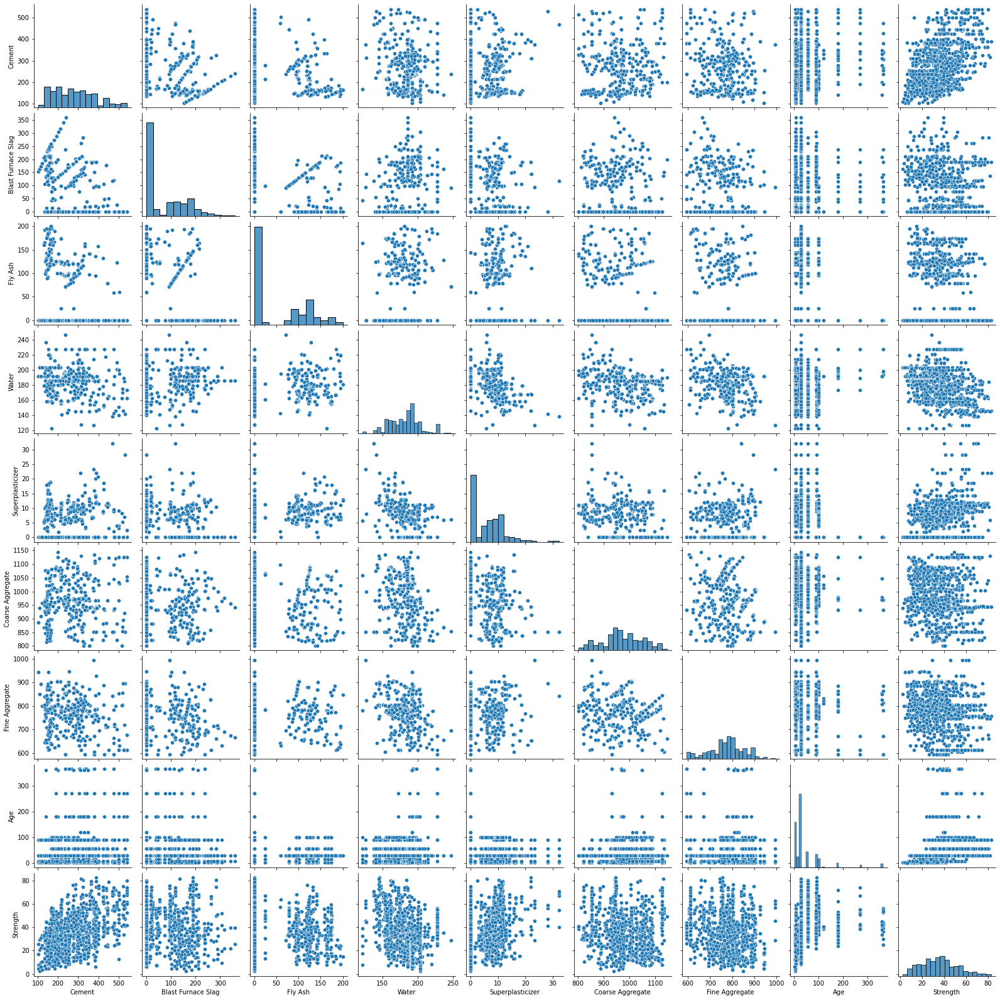

In [5]:
sns.pairplot(df)

Fly ash vs. Cement and Blast furnace slag vs. Cement seems to have some relationship, which is not suprising as usually these materials added to the mix as a percentage of cement. In fly ash, blast furnace slag  and superplasticizer it can be seen that sometimes their values are zeros. This is not an error, these materials are optinal components of the concrete mix.

Check the correlation among the variables.

<AxesSubplot:>

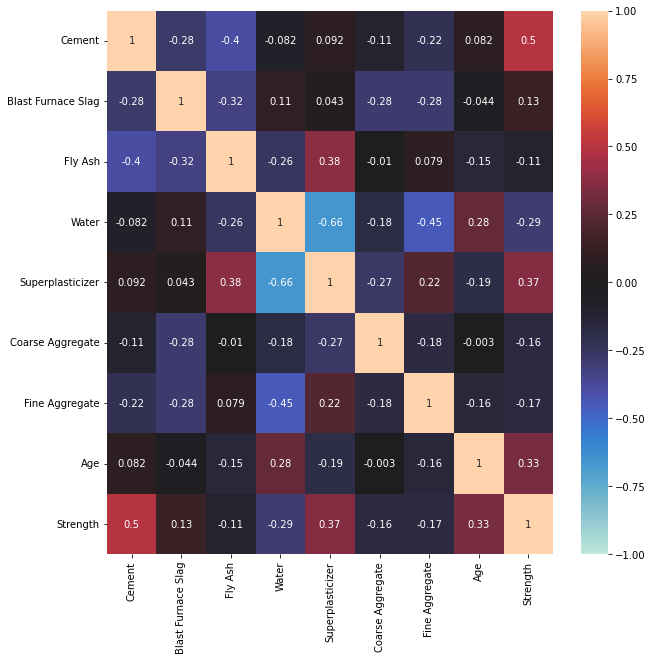

In [6]:
plt.figure(figsize=(10, 10))
hm_color = sns.color_palette('icefire', as_cmap=True)
sns.heatmap(df.corr(),cmap = hm_color, annot=True, vmin=-1, vmax=1)


Strength has a strong correlation with cement, superplasticizer, age and negative correlation with water. The other factors have some effect as well, but significantly smaller. 
Superplasticizer has a strong correlation with water, which is again not a surprise, as superplasticizer mainly added to the mix if the amount of water is low. 

To see the correlation between superplasticizer and water, first I will drop the zero superplasticizer values and then plot them.

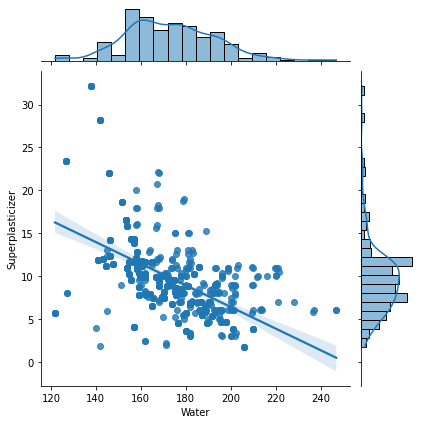

In [7]:
df_sp= df[df['Superplasticizer'] != 0]
sns.jointplot(x="Water", y="Superplasticizer", data=df_sp[["Water", "Superplasticizer"]], kind="reg")

Correlation between cement and strength.

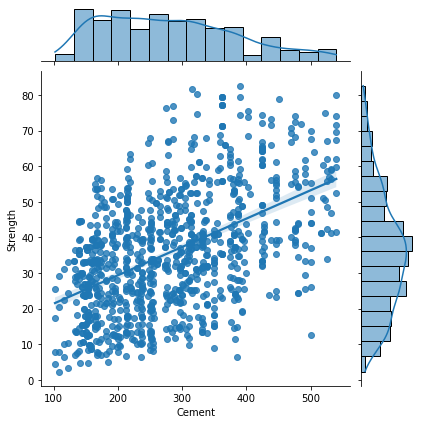

In [8]:
sns.jointplot(x="Cement", y="Strength", data=df[["Cement", "Strength"]], kind="reg")

Correlation between fly ash and cement.

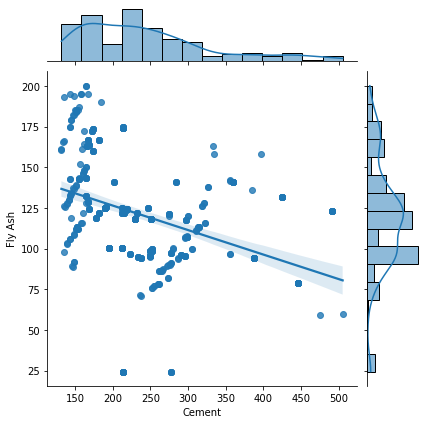

In [9]:
df_fa= df[df['Fly Ash'] != 0]
sns.jointplot(x="Cement", y="Fly Ash", data=df_fa[["Cement", "Fly Ash"]], kind="reg")

Correlation between cement and blast furnace slag.

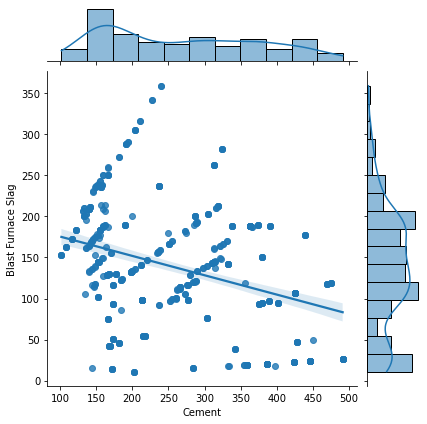

In [10]:
df_bfs= df[df['Blast Furnace Slag'] != 0]
sns.jointplot(x="Cement", y="Blast Furnace Slag", data=df_bfs[["Cement", "Blast Furnace Slag"]], kind="reg")

For Blast Furnace Slag and Fly Ash, it seems like there is some linear relations between them and cement. Some lines seems to appear in the figures.

Check the range of the variables and look for outliers. 

<AxesSubplot:>

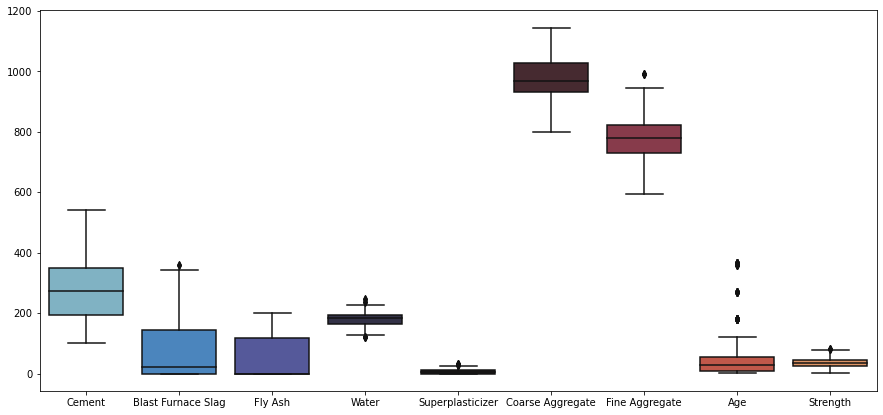

In [11]:
plt.figure(figsize=(15, 7))
sns.boxplot(data=df, palette="icefire")

There are a few outliers in: 
- Blast Furnace Slag
- Water
- Superplasticizer
- and fine aggregate

(in case of 'Age' I would not call a higher value an outlier.)


# Data cleaning

## General data cleaning

In [12]:
print('The data has',df.shape[0],'lines and',df.shape[1],'rows.')

The data has 1030 lines and 9 rows.


#### Check if there are any NaN values in the data.

In [13]:
count_nan = df.isnull().sum()
print('Number of NaN values present: ' + str(count_nan))

Number of NaN values present: Cement                0
Blast Furnace Slag    0
Fly Ash               0
Water                 0
Superplasticizer      0
Coarse Aggregate      0
Fine Aggregate        0
Age                   0
Strength              0
dtype: int64


The data has no NaN values. 

In [14]:
df.describe()

,Cement,Blast Furnace Slag,Fly Ash,Water,Superplasticizer,Coarse Aggregate,Fine Aggregate,Age,Strength
count,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000
mean,281.167864,73.895825,54.188350,181.567282,6.204660,972.918932,773.580485,45.662136,35.817961
std,104.506364,86.279342,63.997004,21.354219,5.973841,77.753954,80.175980,63.169912,16.705742
min,102.000000,0.000000,0.000000,121.800000,0.000000,801.000000,594.000000,1.000000,2.330000
25%,192.375000,0.000000,0.000000,164.900000,0.000000,932.000000,730.950000,7.000000,23.710000
50%,272.900000,22.000000,0.000000,185.000000,6.400000,968.000000,779.500000,28.000000,34.445000
75%,350.000000,142.950000,118.300000,192.000000,10.200000,1029.400000,824.000000,56.000000,46.135000
max,540.000000,359.400000,200.100000,247.000000,32.200000,1145.000000,992.600000,365.000000,82.600000


#### Check for duplicates

In [15]:
df.duplicated().sum()

25

In [16]:
duplicate = df[df.duplicated()]
duplicate

,Cement,Blast Furnace Slag,Fly Ash,Water,Superplasticizer,Coarse Aggregate,Fine Aggregate,Age,Strength
77,425.0,106.3,0.0,153.5,16.5,852.1,887.1,3,33.40
80,425.0,106.3,0.0,153.5,16.5,852.1,887.1,3,33.40
86,362.6,189.0,0.0,164.9,11.6,944.7,755.8,3,35.30
88,362.6,189.0,0.0,164.9,11.6,944.7,755.8,3,35.30
91,362.6,189.0,0.0,164.9,11.6,944.7,755.8,3,35.30
100,425.0,106.3,0.0,153.5,16.5,852.1,887.1,7,49.20
103,425.0,106.3,0.0,153.5,16.5,852.1,887.1,7,49.20
109,362.6,189.0,0.0,164.9,11.6,944.7,755.8,7,55.90
111,362.6,189.0,0.0,164.9,11.6,944.7,755.8,7,55.90
123,425.0,106.3,0.0,153.5,16.5,852.1,887.1,28,60.29


In [17]:
df = df.drop_duplicates()

In [18]:
print('The data has',df.shape[0],'lines and',df.shape[1],'rows.')

The data has 1005 lines and 9 rows.


#### Dropping outliers

Based on the figures check the Z-score of those columns that seemingly have outliers.

In [19]:
print(max(np.abs(stats.zscore(df["Strength"]))))
print(max(np.abs(stats.zscore(df["Fine Aggregate"]))))
print(max(np.abs(stats.zscore(df["Blast Furnace Slag"]))))
print(max(np.abs(stats.zscore(df["Water"]))))

2.9090410567587464
2.7386114202103853
3.336391959913115
3.044003215351953


Based on that drop the outliers which has Z-score above 2.7.

In [20]:
df[(np.abs(stats.zscore(df["Strength"])) < 2.7)]
df[(np.abs(stats.zscore(df["Fine Aggregate"])) < 2.7)]
df[(np.abs(stats.zscore(df["Blast Furnace Slag"])) < 2.7)]
df[(np.abs(stats.zscore(df["Water"])) < 2.7)]

,Cement,Blast Furnace Slag,Fly Ash,Water,Superplasticizer,Coarse Aggregate,Fine Aggregate,Age,Strength
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.99
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.89
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,40.27
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365,41.05
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360,44.30
...,...,...,...,...,...,...,...,...,...
1025,276.4,116.0,90.3,179.6,8.9,870.1,768.3,28,44.28
1026,322.2,0.0,115.6,196.0,10.4,817.9,813.4,28,31.18
1027,148.5,139.4,108.6,192.7,6.1,892.4,780.0,28,23.70
1028,159.1,186.7,0.0,175.6,11.3,989.6,788.9,28,32.77


# Feature engineering

## Composite features

#### Water-to-cement ratio

In [21]:
df['v_c_ratio'] = df['Water']/df['Cement']
df.head(5)

,Cement,Blast Furnace Slag,Fly Ash,Water,Superplasticizer,Coarse Aggregate,Fine Aggregate,Age,Strength,v_c_ratio
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.99,0.300000
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.89,0.300000
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,40.27,0.685714
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365,41.05,0.685714
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360,44.30,0.966767


#### Aggregate-to-cement ratio

In [22]:
df['a_c_ratio'] = (df['Coarse Aggregate']+df['Fine Aggregate'])/df['Cement']
df.head(5)

,Cement,Blast Furnace Slag,Fly Ash,Water,Superplasticizer,Coarse Aggregate,Fine Aggregate,Age,Strength,v_c_ratio,a_c_ratio
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.99,0.300000,3.177778
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.89,0.300000,3.205556
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,40.27,0.685714,4.589474
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365,41.05,0.685714,4.589474
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360,44.30,0.966767,9.083082


#### Fineness modulus

In [23]:
df['fineness'] = df['Fine Aggregate']/df['Coarse Aggregate']
df.head(5)

,Cement,Blast Furnace Slag,Fly Ash,Water,Superplasticizer,Coarse Aggregate,Fine Aggregate,Age,Strength,v_c_ratio,a_c_ratio,fineness
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.99,0.300000,3.177778,0.650000
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.89,0.300000,3.205556,0.640758
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,40.27,0.685714,4.589474,0.637339
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365,41.05,0.685714,4.589474,0.637339
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360,44.30,0.966767,9.083082,0.843724


#### Create a separate dataframe for the composite features and strength and plot them

<AxesSubplot:>

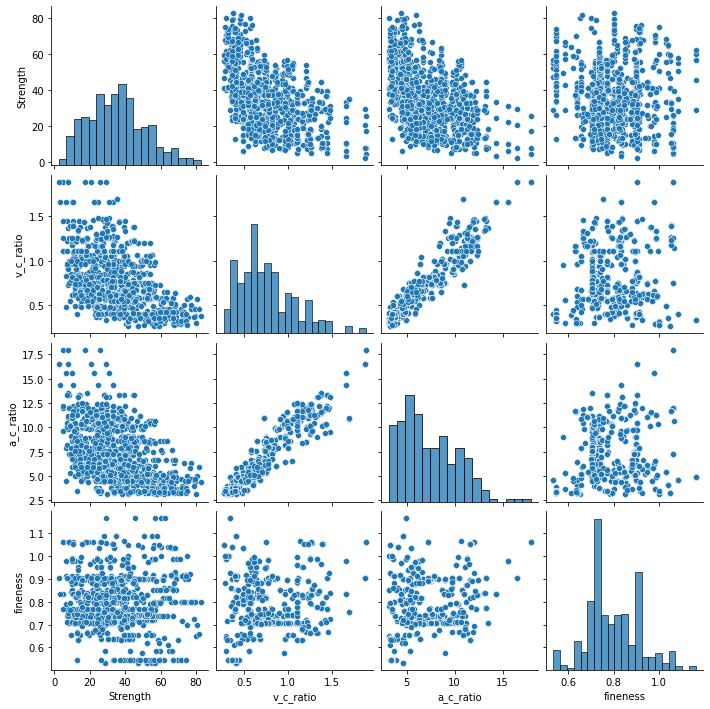

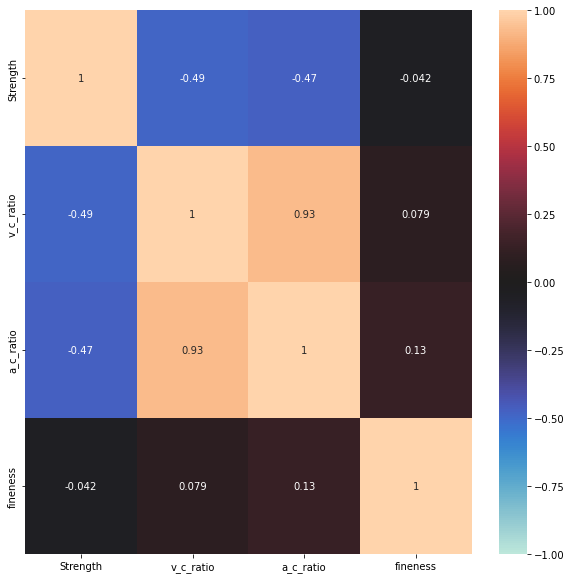

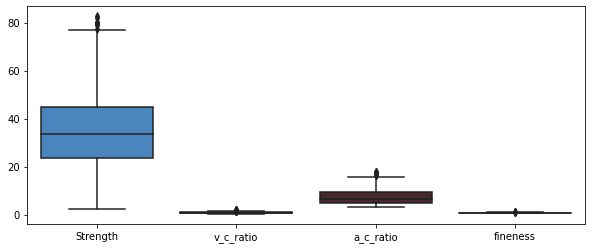

In [24]:
df_comp_feat = df.filter(['Strength', 'v_c_ratio', 'a_c_ratio', 'fineness'], axis=1)
sns.pairplot(df_comp_feat)
plt.figure(figsize=(10, 10))
sns.heatmap(df_comp_feat.corr(),cmap = hm_color, annot=True, vmin=-1, vmax=1)
plt.figure(figsize=(10, 4))
sns.boxplot(data=df_comp_feat, palette="icefire")

There seems to be a negative correlation between v/c ratio and a/c ratio and strength. 

### Strength classes
Concrete strength is represented many times with discrete classes called strength classes. 

In [25]:
conditions = [
    (df['Strength'] <= 9),
    (df['Strength'] > 9) & (df['Strength'] <= 13),
    (df['Strength'] > 13) & (df['Strength'] <= 17),
    (df['Strength'] > 17) & (df['Strength'] <= 21),
    (df['Strength'] > 21) & (df['Strength'] <= 26),
    (df['Strength'] > 26) & (df['Strength'] <= 31),
    (df['Strength'] > 31) & (df['Strength'] <= 38),
    (df['Strength'] > 38) & (df['Strength'] <= 43),
    (df['Strength'] > 43) & (df['Strength'] <= 47),
    (df['Strength'] > 47) & (df['Strength'] <= 51),
    (df['Strength'] > 51) & (df['Strength'] <= 60),
    (df['Strength'] > 60) & (df['Strength'] <= 68),
    (df['Strength'] > 68)
    ]

# create a list of the values we want to assign for each condition
class_values = ['Too low strength', 'C8/10', 'C12/15', 'C16/20', 'C20/25', 'C25/30', 'C30/37', 'C35/45', 'C40/50', 'C45/55', 'C50/60', 'C55/67', 'HSC']

# create a new column and use np.select to assign values to it using our lists as arguments
df['StrengthClass'] = np.select(conditions, class_values)
df.head()

,Cement,Blast Furnace Slag,Fly Ash,Water,Superplasticizer,Coarse Aggregate,Fine Aggregate,Age,Strength,v_c_ratio,a_c_ratio,fineness,StrengthClass
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.99,0.300000,3.177778,0.650000,HSC
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.89,0.300000,3.205556,0.640758,C55/67
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,40.27,0.685714,4.589474,0.637339,C35/45
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365,41.05,0.685714,4.589474,0.637339,C35/45
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360,44.30,0.966767,9.083082,0.843724,C40/50


#### Create a separate dataframe for only the non-normalized columns

In [26]:
df_base = df.copy(deep=True) # the df_base is a data base which does not contain the normalized values that is calculated in the next chapter.

In [27]:
df_base.head()

,Cement,Blast Furnace Slag,Fly Ash,Water,Superplasticizer,Coarse Aggregate,Fine Aggregate,Age,Strength,v_c_ratio,a_c_ratio,fineness,StrengthClass
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.99,0.300000,3.177778,0.650000,HSC
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.89,0.300000,3.205556,0.640758,C55/67
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,40.27,0.685714,4.589474,0.637339,C35/45
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365,41.05,0.685714,4.589474,0.637339,C35/45
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360,44.30,0.966767,9.083082,0.843724,C40/50


## Normalized values

#### Normalization method

In [28]:
def normalize(df,column):
    new_col_name = str(column)+'_norm'
    df[new_col_name] = (df[column]-df[column].min())/(df[column].max()-df[column].min())
    return df

#### Normalize all columns

In [29]:
for column in df.columns:
    if column == 'StrengthClass':
        pass
    else:
        normalize(df,column)

#### Create a separate dataframe for only the filtered columns

In [30]:
df_norm = df.filter(like='_norm')
df_norm

,Cement_norm,Blast Furnace Slag_norm,Fly Ash_norm,Water_norm,Superplasticizer_norm,Coarse Aggregate_norm,Fine Aggregate_norm,Age_norm,Strength_norm,v_c_ratio_norm,a_c_ratio_norm,fineness_norm
0,1.000000,0.000000,0.000000,0.321086,0.077640,0.694767,0.205720,0.074176,0.967485,0.020494,0.005394,0.184684
1,1.000000,0.000000,0.000000,0.321086,0.077640,0.738372,0.205720,0.074176,0.741996,0.020494,0.007267,0.170050
2,0.526256,0.396494,0.000000,0.848243,0.000000,0.380814,0.000000,0.739011,0.472655,0.259258,0.100563,0.164636
3,0.526256,0.396494,0.000000,0.848243,0.000000,0.380814,0.000000,1.000000,0.482372,0.259258,0.100563,0.164636
4,0.220548,0.368392,0.000000,0.560703,0.000000,0.515698,0.580783,0.986264,0.522860,0.433236,0.403497,0.491444
...,...,...,...,...,...,...,...,...,...,...,...,...
1025,0.398174,0.322760,0.451274,0.461661,0.276398,0.200872,0.437280,0.074176,0.522611,0.237016,0.190775,0.553639
1026,0.502740,0.000000,0.577711,0.592652,0.322981,0.049128,0.550426,0.074176,0.359412,0.211349,0.132486,0.730192
1027,0.106164,0.387869,0.542729,0.566294,0.189441,0.265698,0.466633,0.074176,0.266226,0.638054,0.550385,0.539460
1028,0.130365,0.519477,0.000000,0.429712,0.350932,0.548256,0.488961,0.074176,0.379220,0.518005,0.544759,0.417759


<AxesSubplot:>

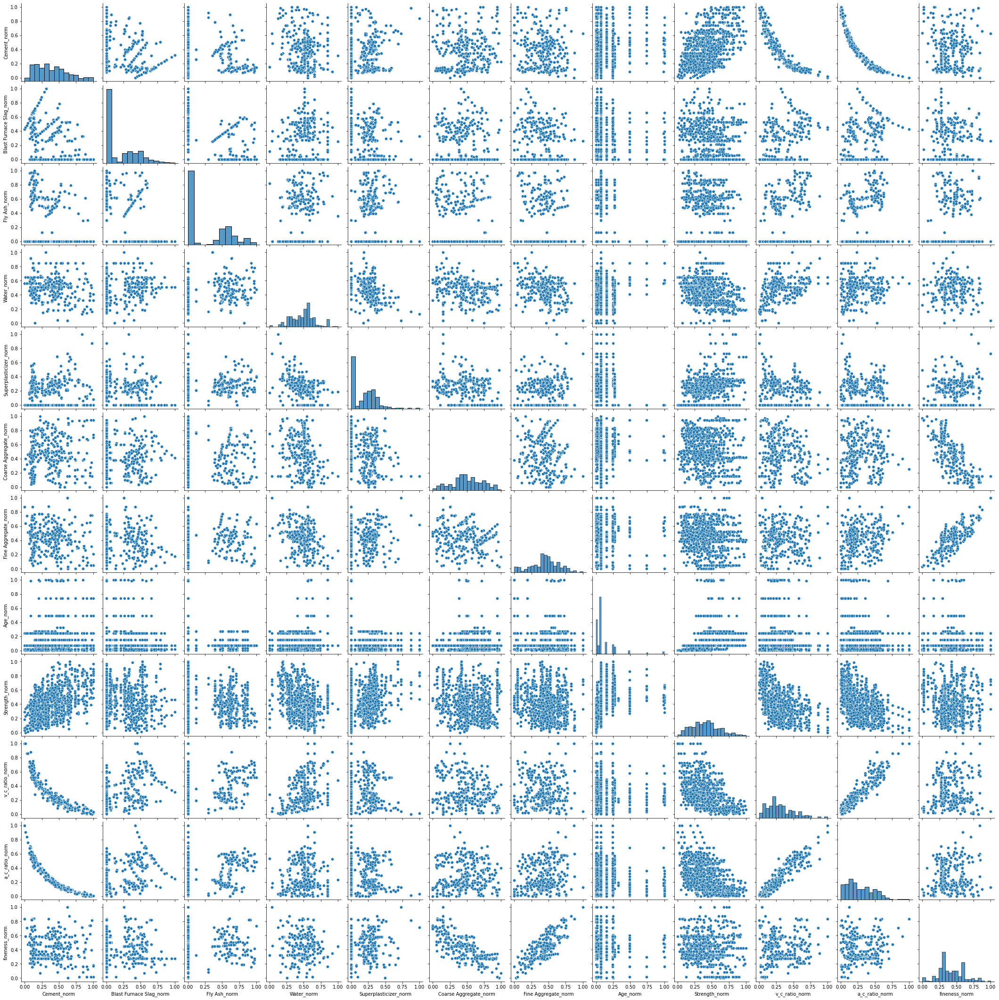

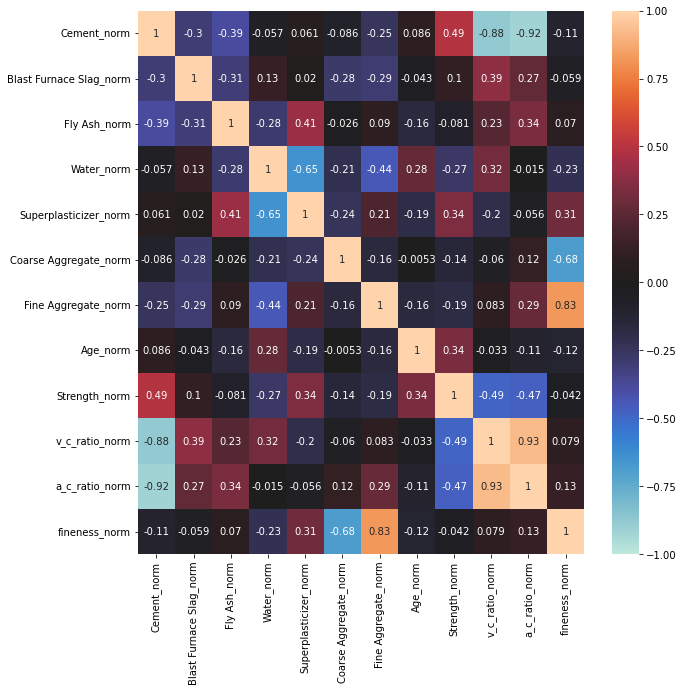

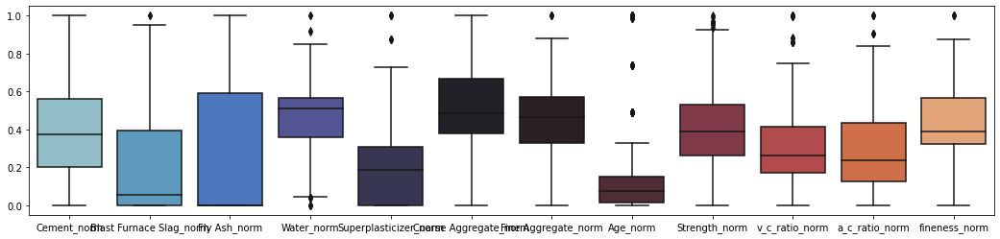

In [31]:
sns.pairplot(df_norm)
plt.figure(figsize=(10, 10))
sns.heatmap(df_norm.corr(),cmap = hm_color, annot=True, vmin=-1, vmax=1)
plt.figure(figsize=(18, 4))
sns.boxplot(data=df_norm, palette="icefire")

# Model creation

## Abstract model classes

In [32]:
from abc import ABCMeta, abstractmethod

class MLModel(metaclass=ABCMeta):
    def __init__(self):
        self._name = "MLModel"

    @property
    def name(self):
        return self._name

    @abstractmethod
    def train(self, data):
        pass

    @abstractmethod
    def predict(self, data):
        pass

class RegressionModel(MLModel):
    def __init__(self, regressiontype):
        self._name = str(regressiontype)[:-2]
    def train(self, regressiontype, data):
        regressor = regressiontype
        regressor.fit(data[0], data[2])  # data[0] = X_train, #data[2] = y_train
        return regressor
    def predict(self, regressor, data):
        y_pred = regressor.predict(data[1]) #data[1] = X_test
        result = pd.DataFrame({'Actual': data[3], 'Predicted': y_pred}) #data[3] = y_test
        return y_pred

class ClassificationModel(MLModel):
    def __init__(self, classificationtype):
        self._name = str(classificationtype)[:-2]
    def train(self, classificationtype, data):
        classifier = classificationtype
        classifier.fit(data[0].values, data[2])
        return classifier
    def predict(self, classifier, data):
        y_pred = classifier.predict(data[1].values)
        result = pd.DataFrame({'Actual': data[3], 'Predicted': y_pred})
        return y_pred


## Data sets

I have used 80-20% data split for training-test as there is not much data. 

### Base dataset for regression

In [33]:
X = df_base.drop(['Strength','StrengthClass'], axis=1)
y = df_base['Strength']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
data = [X_train, X_test, y_train, y_test]
data_dmatrix = xgb.DMatrix(data=X,label=y)

### Base dataset for classification

In [34]:
df_base.StrengthClass, StrengthClass_levels = pd.factorize(df_base.StrengthClass)
X_class = df_base.drop(['Strength','StrengthClass'], axis=1)
y_class = df_base['StrengthClass']
X_train_class, X_test_class, y_train_class, y_test_class = train_test_split(X_class, y_class, test_size=0.2, random_state=42)
data_class = [X_train_class, X_test_class, y_train_class, y_test_class]
data_dmatrix_class = xgb.DMatrix(data=X_class,label=y_class)

### Normalized dataset for regression

In [35]:
X_norm = df_norm.drop(['Strength_norm'], axis=1)
y_norm = df_norm['Strength_norm']
X_train_norm, X_test_norm, y_train_norm, y_test_norm = train_test_split(X_norm, y_norm, test_size=0.2, random_state=42)
data_norm = [X_train_norm, X_test_norm, y_train_norm, y_test_norm]
data_dmatrix_norm = xgb.DMatrix(data=X_norm,label=y_norm)

### Normalized dataset for classification

In [36]:
X_class_norm = df_norm.drop(['Strength_norm'], axis=1)
y_class_norm = df_base['StrengthClass']
X_train_class_norm, X_test_class_norm, y_train_class_norm, y_test_class_norm = train_test_split(X_class_norm, y_class_norm, test_size=0.2, random_state=42)
data_class_norm = [X_train_class_norm, X_test_class_norm, y_train_class_norm, y_test_class_norm]

## Models

I will create regression models to estimate the strength and classification models to estimate the strength classes. 

### Regression models

#### Linear regression model

In [37]:
LinRegModel = RegressionModel(LinearRegression())
linregressor = LinRegModel.train(LinearRegression(), data)
y_pred = LinRegModel.predict(linregressor, data)

In [38]:
LinRegModel_norm = RegressionModel(LinearRegression())
linregressor_norm = LinRegModel_norm.train(LinearRegression(), data_norm)
y_pred_norm = LinRegModel_norm.predict(linregressor_norm, data_norm)

#### XGBoost with Grid Search

In [39]:
params = {"objective":"reg:squarederror",'colsample_bytree': 1,'learning_rate': 0.3,
                'max_depth': 5, 'alpha': 10}

cv_results = xgb.cv(dtrain=data_dmatrix, params=params, nfold=3,
                    num_boost_round=50,early_stopping_rounds=10,metrics="rmse", as_pandas=True, seed=123)
# final boosting round metric
#print((cv_results["test-rmse-mean"]).tail(1))

test_params = {
 'max_depth':[4,8,12], 'colsample_bytree': [0.1,0.5,1], 'learning_rate': [0.1, 0.3, 0.7, 1], 'max_depth': [1, 3, 5, 8], 'alpha': [1, 10, 20, 100], 'n_estimators': [4, 7, 11]

}
XGBReg = RegressionModel(xgb.XGBRegressor())
GridSearchModel = GridSearchCV(estimator = xgb.XGBRegressor(),param_grid = test_params)

XGBregressor = XGBReg.train(GridSearchModel, data)
y_pred_XGB = XGBReg.predict(XGBregressor, data)

print("\n The best estimator across ALL searched params:\n",XGBregressor.best_estimator_)
print("\n The best score across ALL searched params:\n",XGBregressor.best_score_)
print("\n The best parameters across ALL searched params:\n",XGBregressor.best_params_)


 The best estimator across ALL searched params:
 XGBRegressor(alpha=1, base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.3, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=8, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=11, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=1, ...)

 The best score across ALL searched params:
 0.889709021844968

 The best parameters across ALL searched params:
 {'alpha': 1, 'colsample_bytree': 1, 'learning_rate': 0.3, 'max_depth': 8, 'n_estimators': 11}


<AxesSubplot:>

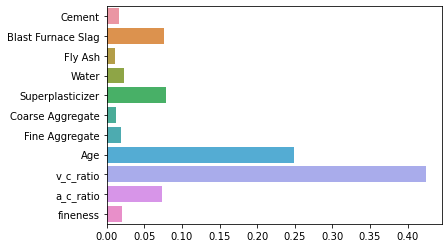

In [40]:
sns.barplot(x=GridSearchModel.best_estimator_.feature_importances_,y=X_train_class.columns)

In [41]:
cv_results = xgb.cv(dtrain=data_dmatrix_norm, params=params, nfold=3,
                    num_boost_round=50,early_stopping_rounds=10,metrics="rmse", as_pandas=True, seed=123)
# final boosting round metric
#print((cv_results["test-rmse-mean"]).tail(1))

XGBReg_norm = RegressionModel(xgb.XGBRegressor())

XGBregressor_norm = XGBReg_norm.train(GridSearchModel, data_norm)
y_pred_XGB_norm = XGBReg_norm.predict(XGBregressor_norm, data_norm)

print("\n The best estimator across ALL searched params:\n",XGBregressor_norm.best_estimator_)
print("\n The best score across ALL searched params:\n",XGBregressor_norm.best_score_)
print("\n The best parameters across ALL searched params:\n",XGBregressor_norm.best_params_)


 The best estimator across ALL searched params:
 XGBRegressor(alpha=1, base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.7, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=8, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=11, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=1, ...)

 The best score across ALL searched params:
 0.8527085650801913

 The best parameters across ALL searched params:
 {'alpha': 1, 'colsample_bytree': 1, 'learning_rate': 0.7, 'max_depth': 8, 'n_estimators': 11}


#### K Nearest Neighbour Regressor

In [42]:
KNNRegModel = RegressionModel(KNeighborsRegressor())
KNNRegressor = KNNRegModel.train(KNeighborsRegressor(n_neighbors=5, metric="minkowski", weights="distance"), data)
# The optimal number of neighbors seems to be 5 based on some iterations.
y_pred_KNNReg = KNNRegModel.predict(KNNRegressor, data)

In [43]:
KNNRegModel_norm = RegressionModel(KNeighborsRegressor())
KNNRegressor_norm = KNNRegModel_norm.train(KNeighborsRegressor(n_neighbors=5, metric="minkowski", weights="distance"), data_norm)
# The optimal number of neighbors seems to be 5 based on some iterations.
y_pred_KNNReg_norm = KNNRegModel_norm.predict(KNNRegressor_norm, data_norm)

#### Decision Tree Regressor

In [44]:
DTRegModel = RegressionModel(DecisionTreeRegressor())
DTRegressor = DTRegModel.train(DecisionTreeRegressor(), data)
y_pred_DTReg = DTRegModel.predict(DTRegressor, data)

<AxesSubplot:>

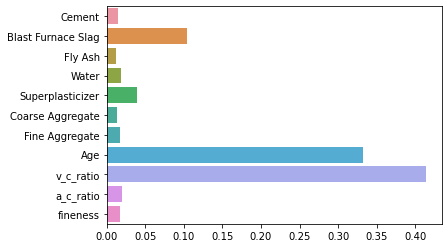

In [45]:
sns.barplot(x=DTRegressor.feature_importances_, y=DTRegressor.feature_names_in_)

In [46]:
DTRegModel_norm = RegressionModel(DecisionTreeRegressor())
DTRegressor_norm = DTRegModel_norm.train(DecisionTreeRegressor(), data_norm)
y_pred_DTReg_norm = DTRegModel_norm.predict(DTRegressor_norm, data_norm)

<AxesSubplot:>

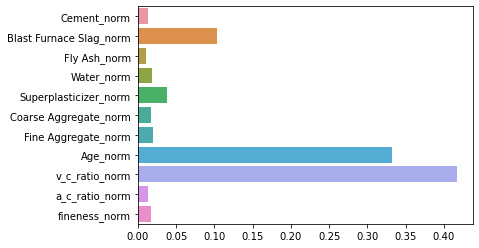

In [47]:
sns.barplot(x=DTRegressor_norm.feature_importances_, y=DTRegressor_norm.feature_names_in_)

#### Random Forest Regressor

In [48]:
RFRegModel = RegressionModel(RandomForestRegressor())
RFRegressor = RFRegModel.train(RandomForestRegressor(), data)
y_pred_RFReg = RFRegModel.predict(RFRegressor, data)

<AxesSubplot:>

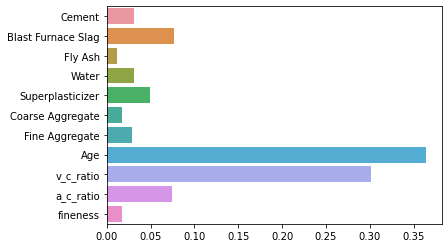

In [49]:
sns.barplot(x=RFRegressor.feature_importances_, y=RFRegressor.feature_names_in_)

In [50]:
RFRegModel_norm = RegressionModel(RandomForestRegressor())
RFRegressor_norm = RFRegModel_norm.train(RandomForestRegressor(), data_norm)
y_pred_RFReg_norm = RFRegModel_norm.predict(RFRegressor_norm, data_norm)

<AxesSubplot:>

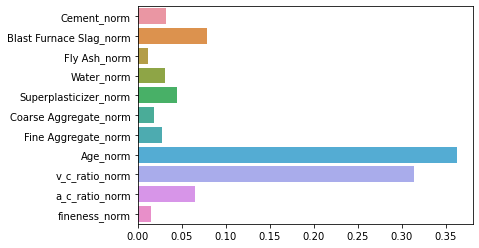

In [51]:
sns.barplot(x=RFRegressor_norm.feature_importances_, y=RFRegressor_norm.feature_names_in_)

It can be seen on the feature importance plots that age and v/c ratio are the most important features, all others have minor effect on the result. Besides them a/c ratio and Blast furnace slag amount contribute the most.

### Classification models

#### Decision trees

In [52]:
DecisionTree = ClassificationModel(DecisionTreeClassifier())
DecTreeClassifer = DecisionTree.train(DecisionTreeClassifier(max_depth = 6), data_class)
y_pred_class = DecisionTree.predict(DecTreeClassifer, data_class)

<AxesSubplot:>

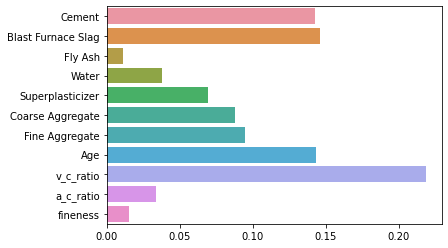

In [53]:
sns.barplot(x=DecTreeClassifer.feature_importances_,y=X_train_class.columns)

In [54]:
DecisionTree_norm = ClassificationModel(DecisionTreeClassifier())
DecTreeClassifer_norm = DecisionTree_norm.train(DecisionTreeClassifier(max_depth = 6), data_class_norm)
y_pred_class_norm = DecisionTree_norm.predict(DecTreeClassifer_norm, data_class_norm)

<AxesSubplot:>

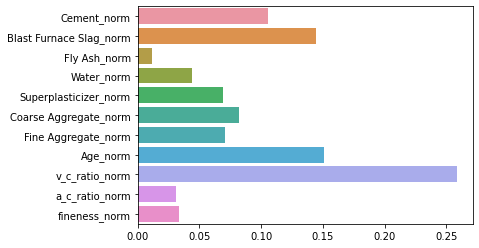

In [55]:
sns.barplot(x=DecTreeClassifer_norm.feature_importances_,y=X_train_class_norm.columns)

##### Decision tree visualization

In [56]:
dtreeviz(
    DecTreeClassifer, 
    X_train_class, 
    y_train_class,
    feature_names=X_train_class.columns,
    target_name=y_train_class.name, 
    class_names=class_values,
    scale=1,
    fontname='DejaVu Sans'
    )

In [57]:
dtreeviz(
    DecTreeClassifer_norm, 
    X_train_class_norm, 
    y_train_class_norm,
    feature_names=X_train_class_norm.columns,
    target_name=y_train_class_norm.name, 
    class_names=class_values,
    scale=1,
    fontname='DejaVu Sans'
    )

#### Random Forest

In [58]:
RFClass = ClassificationModel(RandomForestClassifier())
RFClassifer = RFClass.train(RandomForestClassifier(n_estimators=11, max_depth=6), data_class)
y_pred_RFclass = RFClass.predict(RFClassifer, data_class)

<AxesSubplot:>

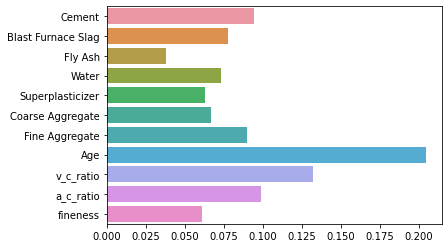

In [59]:
sns.barplot(x=RFClassifer.feature_importances_,y=X_train_class.columns)

In [60]:
RFClass_norm = ClassificationModel(RandomForestClassifier())
RFClassifer_norm = RFClass_norm.train(RandomForestClassifier(n_estimators=11, max_depth=6), data_class_norm)
y_pred_RFclass_norm = RFClass_norm.predict(RFClassifer_norm, data_class_norm)

<AxesSubplot:>

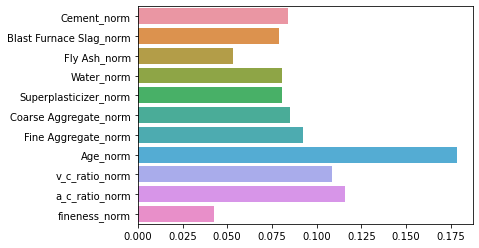

In [61]:
sns.barplot(x=RFClassifer_norm.feature_importances_,y=X_train_class_norm.columns)

#### Support Vector Machine

I have tuned the SVM model according to the conclusions of this study: https://www.csie.ntu.edu.tw/~cjlin/papers/guide/guide.pdf

Note: SVC is quite sensitive to the normalization of the data, thus here only the normalized data can be used.
The GridSearchCV method on SVC could be very timeconsuming. I have done the optimization on a wide range of parameters, here below I only present the final set. 

In [62]:
test_paramsSVC = {
 'C':[100,150,200], 'gamma': [13,14,15], 'kernel': ['poly','rbf'], 'probability': [True]
}
SVClass_norm = ClassificationModel(svm.SVC())
GridSearchModelSVC = GridSearchCV(estimator = svm.SVC(),param_grid = test_paramsSVC)

SVClassifer_norm = SVClass_norm.train(GridSearchModelSVC, data_class_norm)
y_pred_SVclass_norm = SVClass_norm.predict(SVClassifer_norm, data_class_norm)

print("\n The best estimator across ALL searched params:\n",SVClassifer_norm.best_estimator_)
print("\n The best score across ALL searched params:\n",SVClassifer_norm.best_score_)
print("\n The best parameters across ALL searched params:\n",SVClassifer_norm.best_params_)


 The best estimator across ALL searched params:
 SVC(C=200, gamma=14, kernel='poly', probability=True)

 The best score across ALL searched params:
 0.44777950310559006

 The best parameters across ALL searched params:
 {'C': 200, 'gamma': 14, 'kernel': 'poly', 'probability': True}


#### XGBoost classification

In [63]:
params_class = {"objective":"reg:squarederror",'colsample_bytree': 1,'learning_rate': 0.3,
                'max_depth': 5, 'alpha': 10}

cv_results_class = xgb.cv(dtrain=data_dmatrix_class, params=params_class, nfold=3,
                    num_boost_round=50,early_stopping_rounds=10,metrics="rmse", as_pandas=True, seed=123)
# final boosting round metric
#print((cv_results_class["test-rmse-mean"]).tail(1))

test_params_class = {
 'max_depth':[1,2,4],
 'min_child_weight': [1, 5],
 'gamma': [0.5, 1, 1.5],
 'subsample': [0.6, 1.0],
 'colsample_bytree': [0.6, 1.0],
 'learning_rate': [0.1, 0.3, 0.7]
}
XGBClass = ClassificationModel(xgb.XGBClassifier())
GridSearchModelClass = GridSearchCV(estimator = xgb.XGBClassifier(),param_grid = test_params_class, scoring = 'roc_auc',
    verbose=True)

XGBClassifer = XGBClass.train(GridSearchModelClass, data_class)
y_pred_xgbclass = XGBClass.predict(GridSearchModelClass, data_class)

print("\n The best estimator across ALL searched params:\n",XGBClassifer.best_estimator_)
print("\n The best score across ALL searched params:\n",XGBClassifer.best_score_)
print("\n The best parameters across ALL searched params:\n",XGBClassifer.best_params_)


Fitting 5 folds for each of 216 candidates, totalling 1080 fits

 The best estimator across ALL searched params:
 XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.6,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0.5, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.1, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=1, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', random_state=0, reg_alpha=0, ...)

 The best score across ALL searched params:
 nan

 The best parameters across ALL searched params:
 {'colsample_bytree': 0.6, 'gamma': 0.5, 'learning_rate': 0.1, 'max_depth': 1

##### XGBoost classification visualization

<AxesSubplot:>

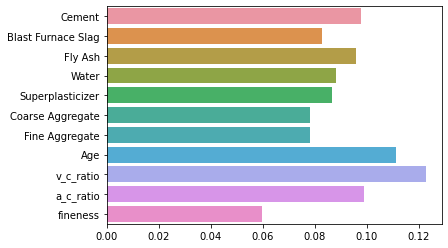

In [64]:
feature_names = list(X_train_class.columns)
#XGBClassifer.get_booster().feature_names = feature_names # As a list or tuple!
sns.barplot(x=GridSearchModelClass.best_estimator_.feature_importances_,y=X_train_class.columns)

In [65]:
#xgb.plot_tree(XGBClassifer ,num_trees=0)
#fig = plt.gcf()
#fig.set_size_inches(20, 12)

In [66]:
#xgb.plot_importance(XGBClassifer)

It seems like 'Age' is the most important feature and 'Fly Ash' is the least relevant. 

In [67]:
XGBClass_norm = ClassificationModel(xgb.XGBClassifier())
XGBClassifer_norm = XGBClass_norm.train(xgb.XGBClassifier(), data_class_norm)
y_pred_xgbclass_norm = XGBClass_norm.predict(XGBClassifer_norm, data_class_norm)

In [68]:
feature_names = list(X_train_class_norm.columns)
XGBClassifer_norm.get_booster().feature_names = feature_names # As a list or tuple!

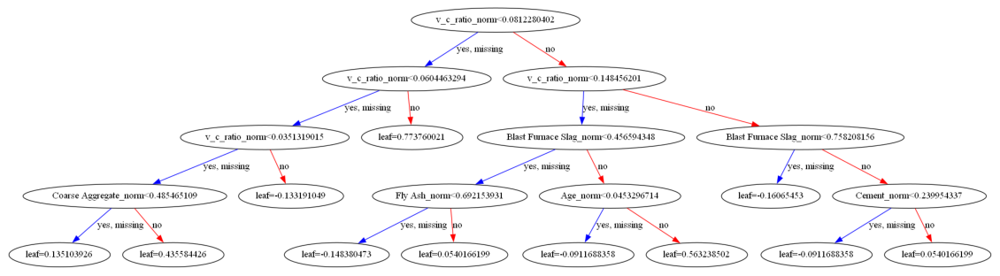

In [69]:
xgb.plot_tree(XGBClassifer_norm ,num_trees=0)
fig = plt.gcf()
fig.set_size_inches(20, 12)

<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

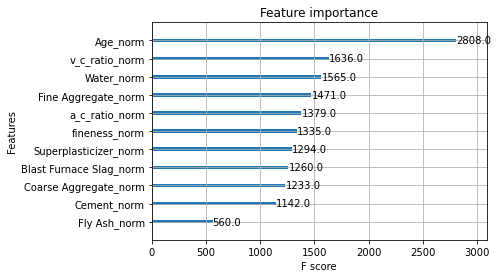

In [70]:
xgb.plot_importance(XGBClassifer_norm)

The importance of features are the same for both normalized and non-normalized data sets. For classification methods Age and v/c ratio are the most important features (similarly to regression methods), however for classification methods the other features have higher importance and they are not the negligible as they were for regression models.

# Evaluation of the results

## Evaluator for regression
This evaluator will calculate for the given model the following metrics:
- Mean Absolute Error (MAE)
- Mean Squared Error (MSE)
- Root Mean Square Error (RMSE)
- R Squared (R²)
- Adjusted R² Score (AdjR²)
- Akaike Information Criterion (AIC)
- Bayesian Information Criterion (BIC)

In [71]:
def evaluator_reg(model, y_test, y_pred, X_test):
    MAE = mean_absolute_error(y_test, y_pred) # Mean absolute error
    MSE = mean_squared_error(y_test, y_pred) # Mean squared error
    RMSE = math.sqrt(mean_squared_error(y_test, y_pred)) #Root mean squared error
    R2 = r2_score(y_test, y_pred) # R^2 score
    n= len(X_test) # Number of data points
    p = len(X_test.columns)+1 #+1 is for y     # Number of independent variables
    adj_R2 = 1 - ((1-R2) * (n-1)/(n-p-1))  # Adjusted R^2 score
    AIC = n * np.log(MSE) + 2 * p
    BIC = n * np.log(MSE) + p * np.log(n)
    print('Results for '+model.name)
    print('MAE:'+str(MAE))
    print('MSE:'+str(MSE))
    print('RMSE:'+str(RMSE))
    print('R2:'+str(R2))
    print('Adj R2: '+str(adj_R2))
    print('AIC: '+str(AIC))
    print('BIC: '+str(BIC))

    return MAE, MSE, RMSE, R2, adj_R2, AIC, BIC


## Evaluator for classification
This evaluator will calculate for the given model the following metrics:
- Accuracy Score
- Precession
- Recall
- F1-Score
- Confusion Matrix
- ROC
- AUC Curve

In [72]:
def evaluator_class(model, classifier, y_train, y_pred, X_train, X_test, y_test):
    AS = accuracy_score(y_test, y_pred) # Accuracy score
    PS = precision_score(y_test, y_pred, average=None) # Precision score
    APS = sum(PS) / len(PS) # Average precision score
    RS = recall_score(y_test, y_pred, average=None) # Recall score
    ARS = sum(RS) / len(RS)# Average recall score
    F1 = f1_score(y_test, y_pred, average=None) # F1 score
    AF1 = sum(F1) / len(F1)# Average F1 score
    CM = confusion_matrix(y_test, y_pred) # Confusion matrix

    print('Results for '+model.name)
    print('Accuracy score: '+str(AS))
    print('Precision score: '+str(PS))
    print('Average precision score: '+str(APS))
    print('Recall score: '+str(RS))
    print('Average recall score: '+str(ARS))
    print('F1 score: '+str(F1))
    print('Average F1 score: '+str(AF1))

    # Confusion matrix
    print('Confusion matrix:'+str(CM))
    plot_confusion_matrix(classifier, X_test, y_test)
    plt.show()

    # ROC and AUC curves  - in case of multiclass classification one vs. rest ROC is calculated
    
    bins = [i/20 for i in range(20)] + [1]
    roc_auc = {}
    class_probabilities = classifier.predict_proba(X_test)
    y_testnp = np.array(y_test)
    unique_y_test = np.unique(y_testnp)
    for i in range(len(unique_y_test)):
        # Gets the class
        c = unique_y_test[i] # Class values
        
        # Prepares an auxiliar dataframe to help with the plots
        df_aux = X_test.copy()
        df_aux['class'] = [1 if y == c else 0 for y in y_test]
        df_aux['prob'] = class_probabilities[:, i]
        df_aux = df_aux.reset_index(drop = True)
        
        # Calculates the ROC Coordinates and plots the ROC Curves
        FPR, TPR, threshold = roc_curve(df_aux['class'], df_aux['prob']) # False positive rate and True positive rate
        roc_auc[i] = auc(FPR, TPR)

        # Printing AUC
        print(f"AUC: {roc_auc[i]}")

        # Plotting the ROC
        plt.figure(figsize = (4, 40))
        plt.subplot(len(unique_y_test), 1, i + 1)
        plt.title('Receiver Operating Characteristic')
        plt.plot(FPR, TPR, 'b', label = 'AUC = %0.2f' % roc_auc[i])
        plt.legend(loc = 'lower right')
        plt.plot([0, 1], [0, 1],'r--')
        plt.xlim([0, 1])
        plt.ylim([0, 1])
        plt.ylabel('True Positive Rate')
        plt.xlabel('False Positive Rate')
        plt.show()
    AFPR = sum(FPR) / len(FPR)# Average false positive rate score
    ATPR = sum(TPR) / len(TPR)# Average true positive rate score
    av_roc_auc = sum(roc_auc.values()) / len(roc_auc) # Average AUC
    print(f"Average AUC: {av_roc_auc}")
    return AS, PS, APS, RS, ARS, F1, AF1, CM, FPR, AFPR, TPR, ATPR, roc_auc, av_roc_auc

## Evaluation of regression models

### Linear regression

In [73]:
MAE_linreg, MSE_linreg, RMSE_linreg, R2_linreg, adj_R2_linreg, AIC_linreg, BIC_linreg = evaluator_reg(LinRegModel, y_test, y_pred, X_test)

Results for LinearRegression
MAE:8.86019703297308
MSE:125.01586460957672
RMSE:11.181049351897911
R2:0.5809405485274015
Adj R2: 0.554192072901491
AIC: 994.5165698712556
BIC: 1034.1562287679644


#### Normalized linear regression

In [74]:
MAE_linregnorm, MSE_linregnorm, RMSE_linregnorm, R2_linregnorm, adj_R2_linregnorm, AIC_linregnorm, BIC_linregnorm = evaluator_reg(LinRegModel_norm, y_test_norm, y_pred_norm, X_test_norm)

Results for LinearRegression
MAE:0.11037993064623243
MSE:0.019402540688533733
RMSE:0.13929300301355318
R2:0.5809405485274015
Adj R2: 0.554192072901491
AIC: -768.4126028904255
BIC: -728.7729439937166


### XGB regression

In [75]:
MAE_XGBReg, MSE_XGBReg, RMSE_XGBReg, R2_XGBReg, adj_R2_XGBReg, AIC_XGBreg, BIC_XGBreg = evaluator_reg(XGBReg, y_test, y_pred_XGB, X_test)

Results for XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, gamma=None,
             gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, predictor=None, random_state=None,
             reg_alpha=None, reg_lambda=None, ..
MAE:3.5618954527556004
MSE:27.99614227378271
RMSE:5.291138088708582
R2:0.9061555262506941
Adj R2: 0.9001654534581852
AIC: 693.7454116741261
BIC: 733.3850705708351


#### Normalized XGB regression

In [76]:
MAE_XGBReg_norm, MSE_XGBReg_norm, RMSE_XGBReg_norm, R2_XGBReg_norm, adj_R2_XGBReg_norm, AIC_XGBreg_norm, BIC_XGBreg_norm = evaluator_reg(XGBReg_norm, y_test_norm, y_pred_XGB_norm, X_test_norm)

Results for XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, gamma=None,
             gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, predictor=None, random_state=None,
             reg_alpha=None, reg_lambda=None, ..
MAE:0.052564338425695085
MSE:0.005330330176944126
RMSE:0.0730091102325191
R2:0.8848746009104826
Adj R2: 0.8775261711813646
AIC: -1028.1027612616654
BIC: -988.4631023649565


### K Nearest Neighbour regression

In [77]:
MAE_KNNReg, MSE_KNNReg, RMSE_KNNReg, R2_KNNReg, adj_R2_KNNReg, AIC_KNNreg, BIC_KNNreg = evaluator_reg(KNNRegModel, y_test, y_pred_KNNReg, X_test)

Results for KNeighborsRegressor
MAE:5.661810160358966
MSE:66.61257801329926
RMSE:8.16165289713421
R2:0.7767112958774796
Adj R2: 0.7624588254015741
AIC: 867.9775771734261
BIC: 907.617236070135


#### Normalized K Nearest Neighbour regression

In [78]:
MAE_KNNReg_norm, MSE_KNNReg_norm, RMSE_KNNReg_norm, R2_KNNReg_norm, adj_R2_KNNReg_norm, AIC_KNNreg_norm, BIC_KNNreg_norm = evaluator_reg(KNNRegModel_norm, y_test_norm, y_pred_KNNReg_norm, X_test_norm)

Results for KNeighborsRegressor
MAE:0.07607891950822473
MSE:0.011027992570859452
RMSE:0.1050142493705471
R2:0.761815496651975
Adj R2: 0.7466122304808245
AIC: -881.9710103559728
BIC: -842.3313514592639


### Decision Tree regression

In [79]:
MAE_DTReg, MSE_DTReg, RMSE_DTReg, R2_DTReg, adj_R2_DTReg, AIC_DTreg, BIC_DTreg = evaluator_reg(DTRegModel, y_test, y_pred_DTReg, X_test)

Results for DecisionTreeRegressor
MAE:3.839825870646766
MSE:36.096629477611934
RMSE:6.008047060202835
R2:0.8790022866606729
Adj R2: 0.871279028362418
AIC: 744.826098436468
BIC: 784.465757333177


#### Normalized Decision Tree regression

In [80]:
MAE_DTReg_norm, MSE_DTReg_norm, RMSE_DTReg_norm, R2_DTReg_norm, adj_R2_DTReg_norm, AIC_DTreg_norm, BIC_DTreg_norm = evaluator_reg(DTRegModel_norm, y_test_norm, y_pred_DTReg_norm, X_test_norm)

Results for DecisionTreeRegressor
MAE:0.04746883497053167
MSE:0.00542735053514349
RMSE:0.07367055405753027
R2:0.882779138324352
Adj R2: 0.8752969556642042
AIC: -1024.4771432002497
BIC: -984.8374843035408


### Random Forest regression

In [81]:
MAE_RFReg, MSE_RFReg, RMSE_RFReg, R2_RFReg, adj_R2_RFReg, AIC_RFreg, BIC_RFreg = evaluator_reg(RFRegModel, y_test, y_pred_RFReg, X_test)

Results for RandomForestRegressor
MAE:3.452136567164181
MSE:26.239011877006572
RMSE:5.122402939735078
R2:0.9120455155135643
Adj R2: 0.9064313994825152
AIC: 680.716708554354
BIC: 720.3563674510629


#### Normalized Random Forest regression

In [82]:
MAE_RFReg_norm, MSE_RFReg_norm, RMSE_RFReg_norm, R2_RFReg_norm, adj_R2_RFReg_norm, AIC_RFreg_norm, BIC_RFreg_norm = evaluator_reg(RFRegModel_norm, y_test_norm, y_pred_RFReg_norm, X_test_norm)

Results for RandomForestRegressor
MAE:0.04194202649155526
MSE:0.003897107524396444
RMSE:0.06242681734956896
R2:0.9158295932620603
Adj R2: 0.9104570141085747
AIC: -1091.0516529461936
BIC: -1051.4119940494847


## Evaluation of classification models

### Decision Tree classification

Results for DecisionTreeClassifier
Accuracy score: 0.3482587064676617
Precision score: [0.6        0.66666667 0.22222222 0.66666667 0.         0.34782609
 0.22222222 0.35294118 0.66666667 0.42857143 0.25       0.5
 0.33333333]
Average precision score: 0.4043935745981782
Recall score: [0.33333333 0.22222222 0.25       0.1        0.         0.72727273
 0.21052632 0.57142857 0.28571429 0.47368421 0.44444444 0.13636364
 0.16666667]
Average recall score: 0.30166587798166744
F1 score: [0.42857143 0.33333333 0.23529412 0.17391304 0.         0.47058824
 0.21621622 0.43636364 0.4        0.45       0.32       0.21428571
 0.22222222]
Average F1 score: 0.3000606113393837
Confusion matrix:[[ 3  0  1  1  0  0  0  4  0  0  0  0  0]
 [ 1  2  0  0  0  1  0  5  0  0  0  0  0]
 [ 0  0  4  0  1 10  0  1  0  0  0  0  0]
 [ 0  0  3  2  0  7  2  6  0  0  0  0  0]
 [ 0  0  1  0  0  5  1  3  0  0  0  0  1]
 [ 0  0  4  0  0 24  2  3  0  0  0  0  0]
 [ 0  0  0  0  0 13  4  0  0  1  0  1  0]
 [ 1  1  4  0  1  2  

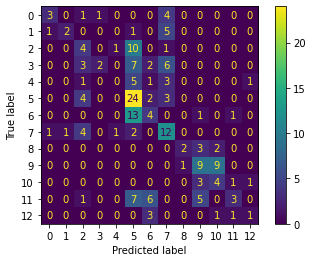

AUC: 0.7734375


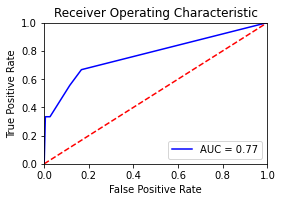

AUC: 0.8634259259259258


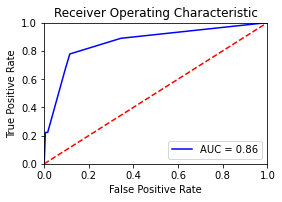

AUC: 0.8168918918918919


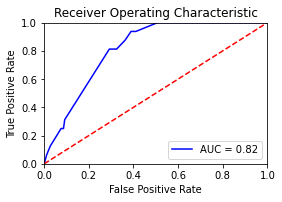

AUC: 0.6850828729281768


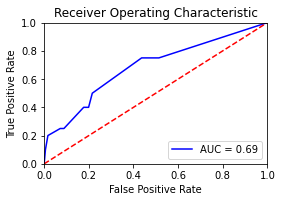

AUC: 0.614354066985646


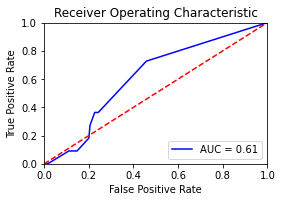

AUC: 0.7946428571428572


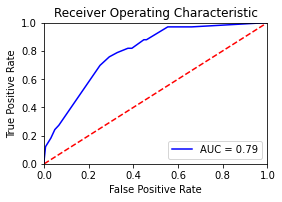

AUC: 0.8048004626951994


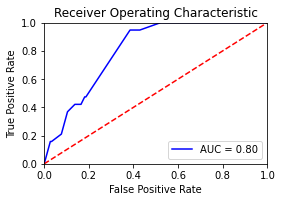

AUC: 0.8707671957671956


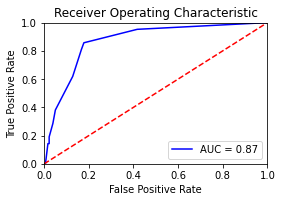

AUC: 0.9477172312223858


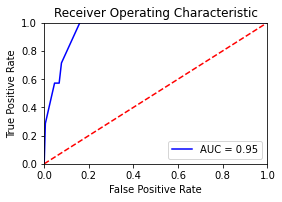

AUC: 0.8708791208791209


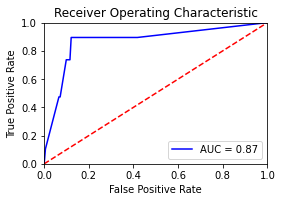

AUC: 0.8229166666666666


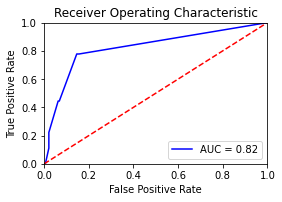

AUC: 0.7809801929913662


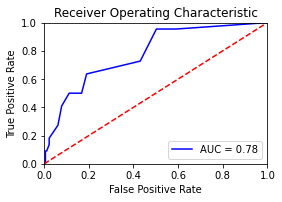

AUC: 0.9183760683760684


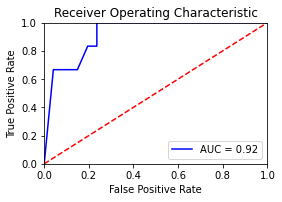

Average AUC: 0.8126363118055769


In [83]:
AS_DT, PS_DT, APS_DT, RS_DT, ARS_DT, F1_DT, AF1_DT, CM_DT, FPR_DT, AFPR_DT, TPR_DT, ATPR_DT, roc_auc_DT, av_roc_auc_DT  = evaluator_class(DecisionTree, DecTreeClassifer, y_train_class, y_pred_class, X_train_class, X_test_class, y_test_class)

#### Normalized Decision Tree classification

Results for DecisionTreeClassifier
Accuracy score: 0.3482587064676617
Precision score: [0.66666667 0.66666667 0.22222222 0.66666667 0.         0.33823529
 0.21052632 0.36363636 1.         0.42857143 0.23529412 0.5
 0.33333333]
Average precision score: 0.43321685194750204
Recall score: [0.44444444 0.22222222 0.25       0.1        0.         0.6969697
 0.21052632 0.57142857 0.28571429 0.47368421 0.44444444 0.13636364
 0.16666667]
Average recall score: 0.30788188419767365
F1 score: [0.53333333 0.33333333 0.23529412 0.17391304 0.         0.45544554
 0.21052632 0.44444444 0.44444444 0.45       0.30769231 0.21428571
 0.22222222]
Average F1 score: 0.3096103708634653
Confusion matrix:[[ 4  0  1  1  0  0  0  3  0  0  0  0  0]
 [ 1  2  0  0  0  1  0  5  0  0  0  0  0]
 [ 0  0  4  0  1 10  0  1  0  0  0  0  0]
 [ 0  0  3  2  0  7  2  6  0  0  0  0  0]
 [ 0  0  1  0  0  5  1  3  0  0  0  0  1]
 [ 0  0  4  0  0 23  3  3  0  0  0  0  0]
 [ 0  0  0  0  0 13  4  0  0  1  0  1  0]
 [ 1  1  4  0  1  2  

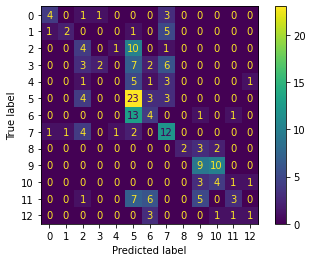

AUC: 0.8373842592592592


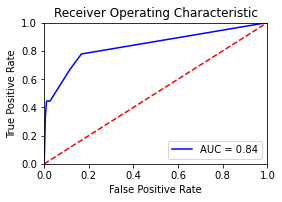

AUC: 0.8596643518518519


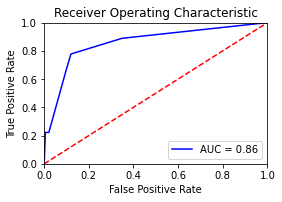

AUC: 0.8163851351351351


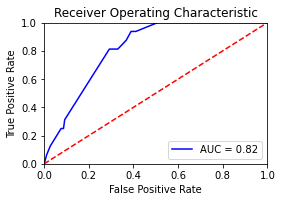

AUC: 0.6955801104972377


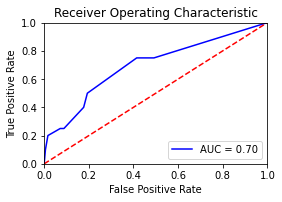

AUC: 0.6188995215311004


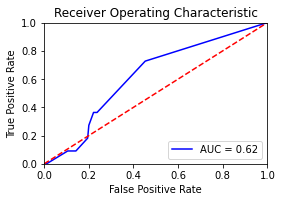

AUC: 0.770021645021645


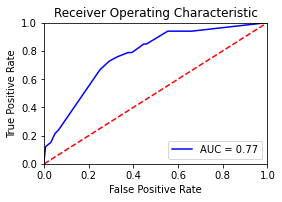

AUC: 0.7995951417004048


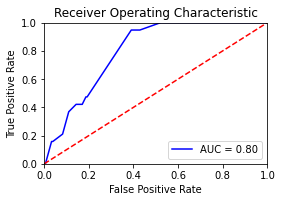

AUC: 0.8753968253968254


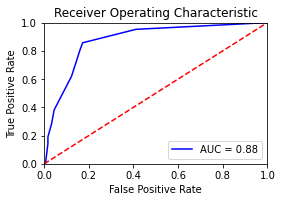

AUC: 0.9521354933726067


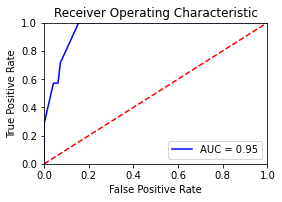

AUC: 0.9045691150954308


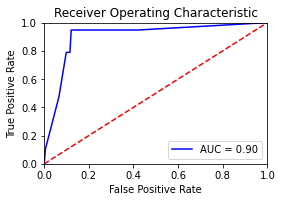

AUC: 0.8191550925925926


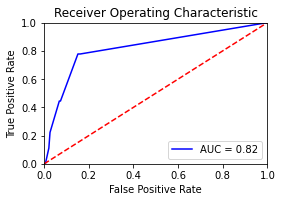

AUC: 0.7840274250888778


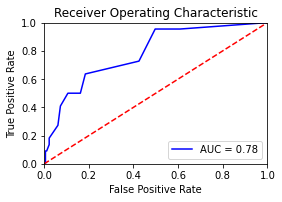

AUC: 0.9183760683760684


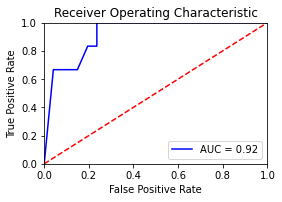

Average AUC: 0.8193223219168488


In [84]:
AS_DTnorm, PS_DTnorm, APS_DTnorm, RS_DTnorm, ARS_DTnorm, F1_DTnorm, AF1_DTnorm, CM_DTnorm, FPR_DTnorm, AFPR_DTnorm, TPR_DTnorm, ATPR_DTnorm, roc_auc_DTnorm, av_roc_auc_DTnorm  = evaluator_class(DecisionTree_norm, DecTreeClassifer_norm, y_train_class_norm, y_pred_class_norm, X_train_class_norm, X_test_class_norm, y_test_class_norm)

### Random Forest classification

Results for RandomForestClassifier
Accuracy score: 0.3482587064676617
Precision score: [1.         0.4        0.13636364 0.5        0.         0.31506849
 0.36363636 0.44       0.5        0.46666667 0.25       0.58333333
 0.18181818]
Average precision score: 0.39514512884375896
Recall score: [0.22222222 0.44444444 0.1875     0.05       0.         0.6969697
 0.21052632 0.52380952 0.42857143 0.36842105 0.33333333 0.31818182
 0.33333333]
Average recall score: 0.31671639763745024
F1 score: [0.36363636 0.42105263 0.15789474 0.09090909 0.         0.43396226
 0.26666667 0.47826087 0.46153846 0.41176471 0.28571429 0.41176471
 0.23529412]
Average F1 score: 0.30911222307798814
Confusion matrix:[[ 2  3  0  1  0  1  0  2  0  0  0  0  0]
 [ 0  4  1  0  0  0  0  4  0  0  0  0  0]
 [ 0  0  3  0  0 12  0  1  0  0  0  0  0]
 [ 0  0  4  1  0 11  0  4  0  0  0  0  0]
 [ 0  0  5  0  0  2  0  3  0  0  0  0  1]
 [ 0  0  5  0  0 23  3  0  0  0  0  2  0]
 [ 0  0  0  0  0 14  4  0  0  0  0  0  1]
 [ 0  3  4  0

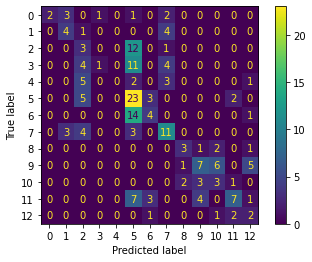

AUC: 0.9296875


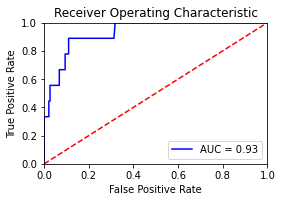

AUC: 0.9004629629629629


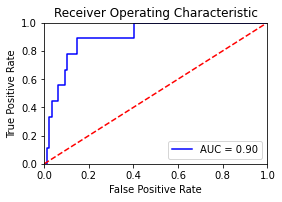

AUC: 0.7827702702702702


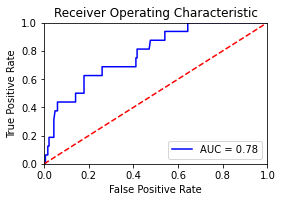

AUC: 0.8319060773480663


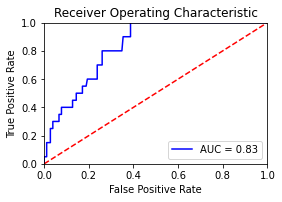

AUC: 0.8461722488038277


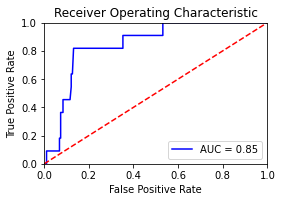

AUC: 0.7798520923520924


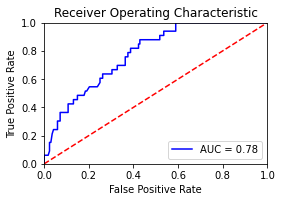

AUC: 0.7683632157316367


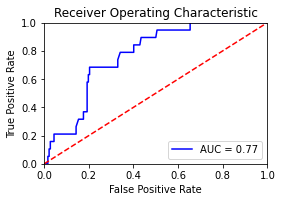

AUC: 0.8924603174603175


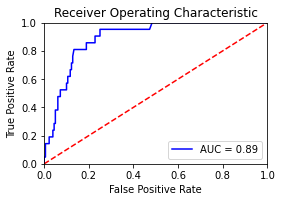

AUC: 0.9385125184094256


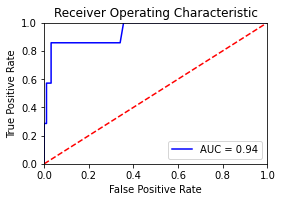

AUC: 0.9349334875650666


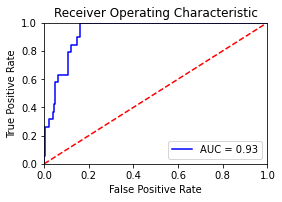

AUC: 0.9085648148148148


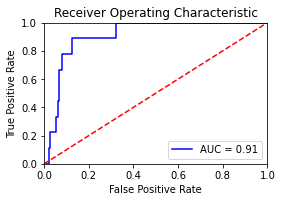

AUC: 0.8892839004570848


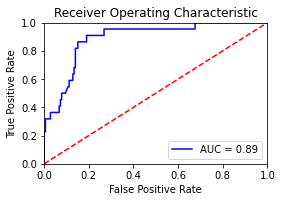

AUC: 0.8760683760683761


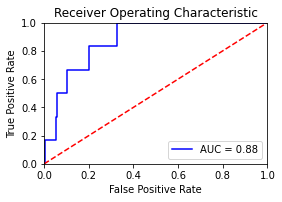

Average AUC: 0.8676182909418417


In [85]:
AS_RF, PS_RF, APS_RF, RS_RF, ARS_RF, F1_RF, AF1_RF, CM_RF, FPR_RF, AFPR_RF, TPR_RF, ATPR_RF, roc_auc_RF, av_roc_auc_RF  = evaluator_class(RFClass, RFClassifer, y_train_class, y_pred_RFclass, X_train_class, X_test_class, y_test_class)

#### Normalized Random Forest classification

Results for RandomForestClassifier
Accuracy score: 0.34328358208955223
Precision score: [0.4        0.22222222 0.16666667 1.         0.         0.32857143
 0.25       0.39285714 0.5        0.66666667 0.25       0.57142857
 0.        ]
Average precision score: 0.36526251526251524
Recall score: [0.22222222 0.22222222 0.1875     0.05       0.         0.6969697
 0.15789474 0.52380952 0.42857143 0.31578947 0.33333333 0.54545455
 0.        ]
Average recall score: 0.2833667063930222
F1 score: [0.28571429 0.22222222 0.17647059 0.0952381  0.         0.44660194
 0.19354839 0.44897959 0.46153846 0.42857143 0.28571429 0.55813953
 0.        ]
Average F1 score: 0.2771337555999135
Confusion matrix:[[ 2  3  0  0  0  1  0  3  0  0  0  0  0]
 [ 2  2  1  0  0  1  0  3  0  0  0  0  0]
 [ 0  0  3  0  0  9  0  4  0  0  0  0  0]
 [ 0  0  2  1  0 12  0  5  0  0  0  0  0]
 [ 0  0  4  0  0  5  0  1  0  0  0  1  0]
 [ 0  0  3  0  1 23  3  1  0  0  0  1  1]
 [ 0  0  2  0  0 11  3  0  0  0  0  2  1]
 [ 1  4  2  0 

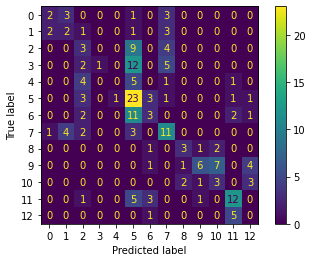

AUC: 0.9646990740740741


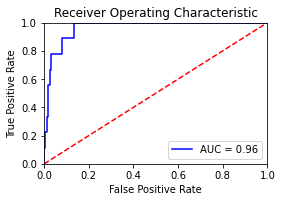

AUC: 0.912037037037037


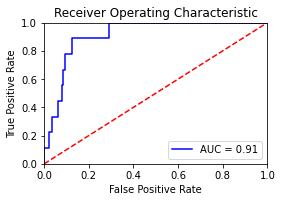

AUC: 0.7815878378378379


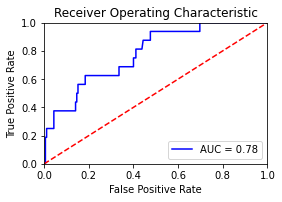

AUC: 0.8034530386740332


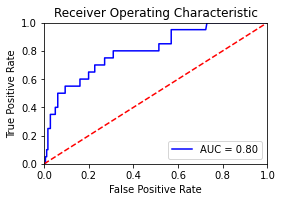

AUC: 0.7990430622009569


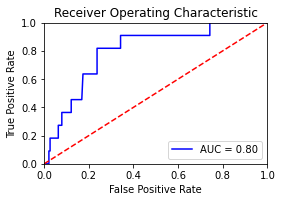

AUC: 0.8110569985569986


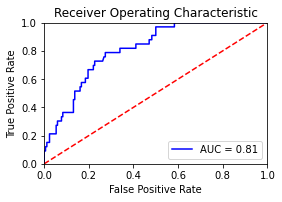

AUC: 0.7067669172932332


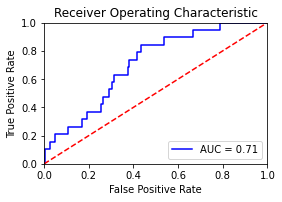

AUC: 0.8945767195767196


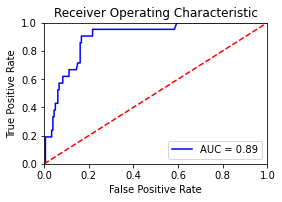

AUC: 0.8744477172312224


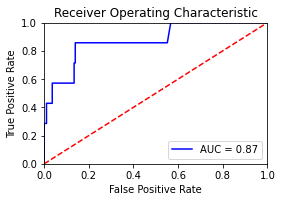

AUC: 0.9395604395604396


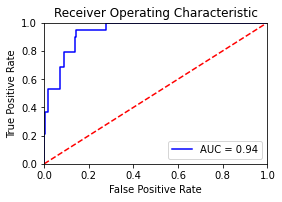

AUC: 0.9403935185185185


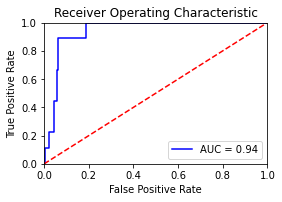

AUC: 0.8571609954291517


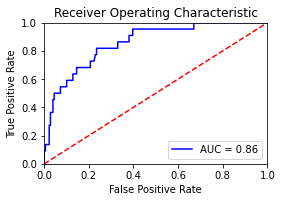

AUC: 0.8076923076923077


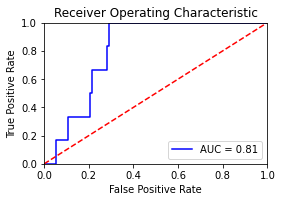

Average AUC: 0.8532673587448101


In [86]:
AS_RFnorm, PS_RFnorm, APS_RFnorm, RS_RFnorm, ARS_RFnorm, F1_RFnorm, AF1_RFnorm, CM_RFnorm, FPR_RFnorm, AFPR_RFnorm, TPR_RFnorm, ATPR_RFnorm, roc_auc_RFnorm, av_roc_auc_RFnorm  = evaluator_class(RFClass_norm, RFClassifer_norm, y_train_class_norm, y_pred_RFclass_norm, X_train_class_norm, X_test_class_norm, y_test_class_norm)

### Support Vector Machine classification

#### Normalized Support Vector Machine classification

Results for SVC
Accuracy score: 0.5124378109452736
Precision score: [0.72727273 0.5        0.25       0.6        0.14285714 0.6
 0.55       0.60869565 0.625      0.5        0.33333333 0.70588235
 0.41666667]
Average precision score: 0.5045929134803815
Recall score: [0.88888889 0.44444444 0.4375     0.3        0.09090909 0.63636364
 0.57894737 0.66666667 0.71428571 0.26315789 0.44444444 0.54545455
 0.83333333]
Average recall score: 0.5264920021498969
F1 score: [0.8        0.47058824 0.31818182 0.4        0.11111111 0.61764706
 0.56410256 0.63636364 0.66666667 0.34482759 0.38095238 0.61538462
 0.55555556]
Average F1 score: 0.4985677868186841
Confusion matrix:[[ 8  0  0  0  0  0  0  1  0  0  0  0  0]
 [ 2  4  1  0  0  0  0  2  0  0  0  0  0]
 [ 0  0  7  0  2  4  1  2  0  0  0  0  0]
 [ 0  1  7  6  1  3  0  2  0  0  0  0  0]
 [ 0  0  6  1  1  0  0  2  0  0  0  1  0]
 [ 0  0  7  1  1 21  2  0  0  0  0  1  0]
 [ 0  0  0  1  0  5 11  0  0  0  0  1  1]
 [ 1  3  0  1  2  0  0 14  0  0  0  0  0]

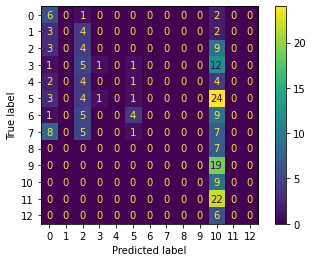

AUC: 0.8854166666666667


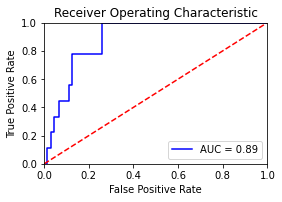

AUC: 0.6446759259259259


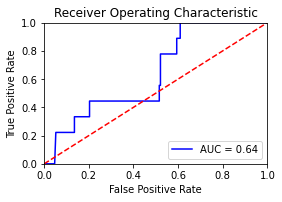

AUC: 0.6478040540540541


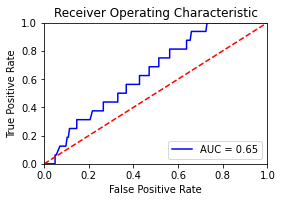

AUC: 0.75


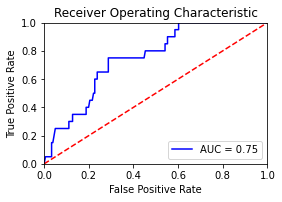

AUC: 0.6600478468899522


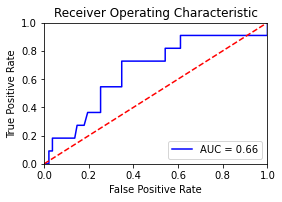

AUC: 0.6201298701298703


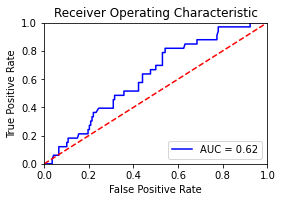

AUC: 0.5562463851937535


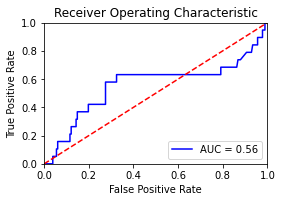

AUC: 0.7527777777777778


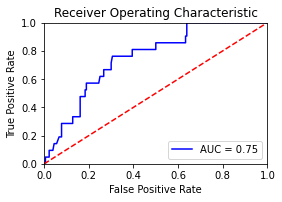

AUC: 0.18998527245949925


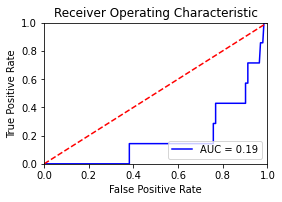

AUC: 0.2549161364950839


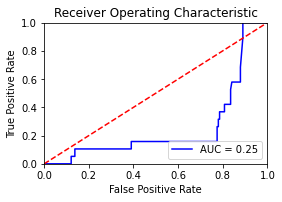

AUC: 0.802951388888889


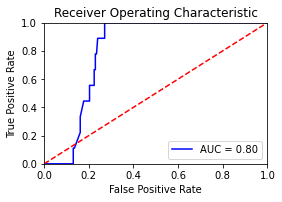

AUC: 0.36185881157948196


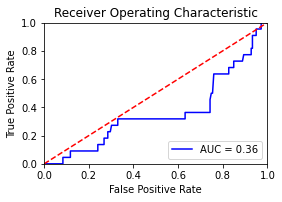

AUC: 0.3726495726495726


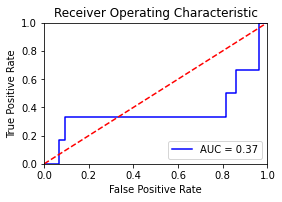

Average AUC: 0.5768815160546559


In [87]:
AS_SVCnorm, PS_SVCnorm, APS_SVCnorm, RS_SVCnorm, ARS_SVCnorm, F1_SVCnorm, AF1_SVCnorm, CM_SVCnorm, FPR_SVCnorm, AFPR_SVCnorm, TPR_SVCnorm, ATPR_SVCnorm, roc_auc_SVCnorm, av_roc_auc_SVCnorm  = evaluator_class(SVClass_norm, SVClassifer_norm, y_train_class, y_pred_SVclass_norm, X_train_class, X_test_class, y_test_class)

### XG Boost classification

Results for XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, gamma=None,
              gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, predictor=None, random_state=None,
              reg_alpha=None, reg_lambda=None, ..
Accuracy score: 0.2935323383084577
Precision score: [0.5        0.33333333 0.2        1.         0.         0.29166667
 0.21428571 0.34482759 0.6        0.375      0.14285714 0.31818182
 0.        ]
Average precision score: 0.3323194047331978
Recall

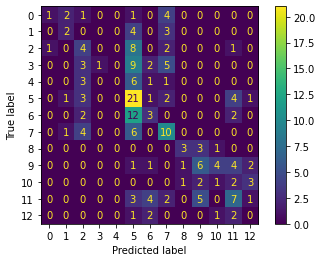

AUC: 0.9265046296296298


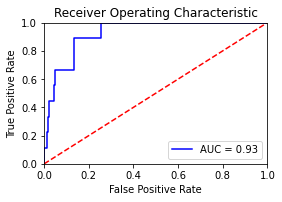

AUC: 0.9195601851851851


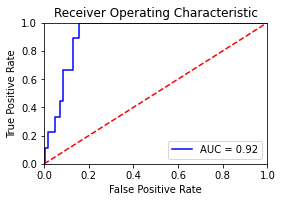

AUC: 0.6469594594594594


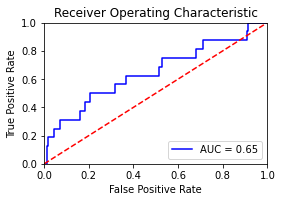

AUC: 0.730939226519337


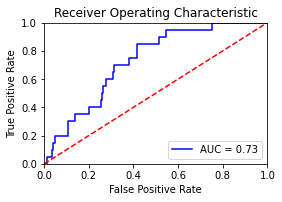

AUC: 0.7732057416267942


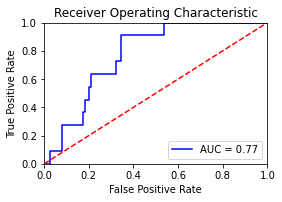

AUC: 0.7135642135642135


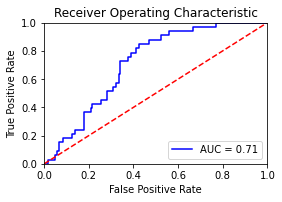

AUC: 0.6607865818392133


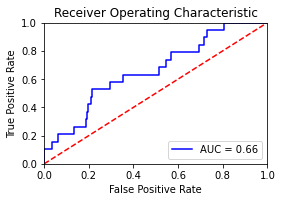

AUC: 0.8537037037037036


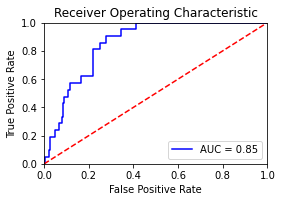

AUC: 0.9410898379970545


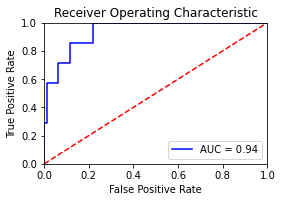

AUC: 0.9146905725853094


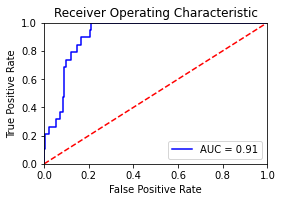

AUC: 0.9369212962962963


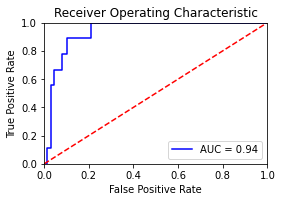

AUC: 0.7430167597765364


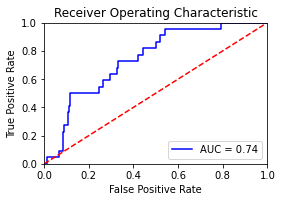

AUC: 0.7965811965811966


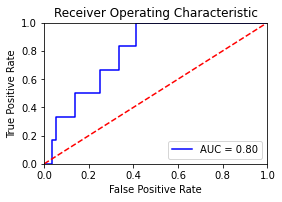

Average AUC: 0.8121171849818407


In [88]:
AS_XGB, PS_XGB, APS_XGB, RS_XGB, ARS_XGB, F1_XGB, AF1_XGB, CM_XGB, FPR_XGB, AFPR_XGB, TPR_XGB, ATPR_XGB, roc_auc_XGB, av_roc_auc_XGB = evaluator_class(XGBClass, XGBClassifer, y_train_class, y_pred_xgbclass, X_train_class, X_test_class, y_test_class)

#### Normalized XG Boost classification

Results for XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, gamma=None,
              gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, predictor=None, random_state=None,
              reg_alpha=None, reg_lambda=None, ..
Accuracy score: 0.5074626865671642
Precision score: [0.83333333 0.63636364 0.27272727 0.66666667 0.4        0.48717949
 0.55555556 0.57692308 0.57142857 0.53333333 0.33333333 0.55555556
 0.30769231]
Average precision score: 0.5176993946224715
Recall

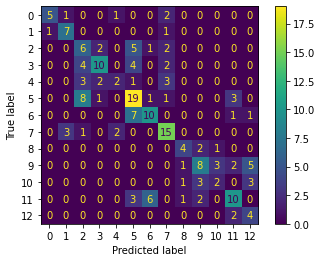

AUC: 0.8518518518518519


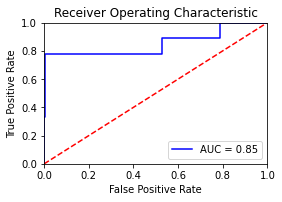

AUC: 0.9681712962962963


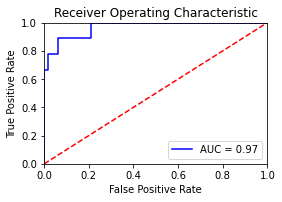

AUC: 0.8567567567567568


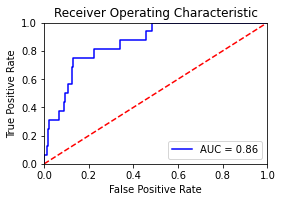

AUC: 0.8569060773480662


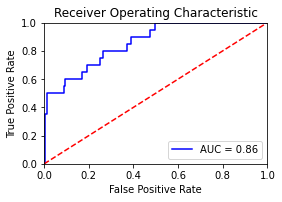

AUC: 0.6813397129186602


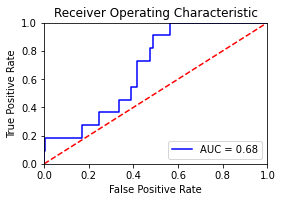

AUC: 0.8759018759018758


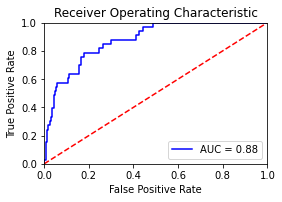

AUC: 0.8441295546558705


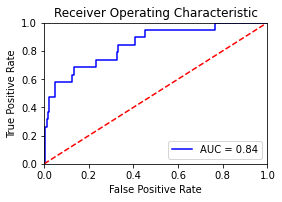

AUC: 0.8814814814814814


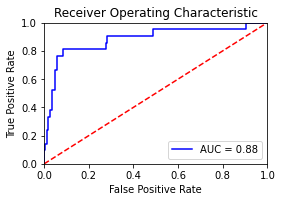

AUC: 0.9285714285714286


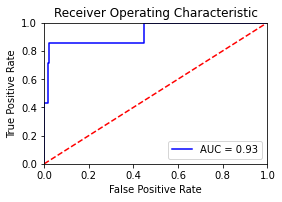

AUC: 0.9138230190861769


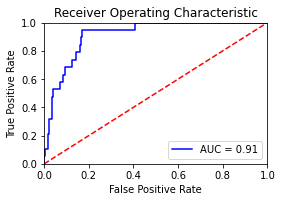

AUC: 0.8616898148148148


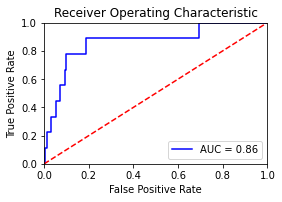

AUC: 0.8905535804977145


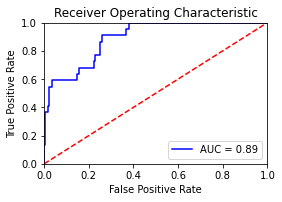

AUC: 0.9538461538461539


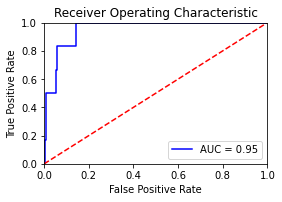

Average AUC: 0.8742325080020883


In [89]:
AS_XGBnorm, PS_XGBnorm, APS_XGBnorm, RS_XGBnorm, ARS_XGBnorm, F1_XGBnorm, AF1_XGBnorm, CM_XGBnorm, FPR_XGBnorm, AFPR_XGBnorm, TPR_XGBnorm, ATPR_XGBnorm, roc_auc_XGBnorm, av_roc_auc_XGBnorm = evaluator_class(XGBClass_norm, XGBClassifer_norm, y_train_class_norm, y_pred_xgbclass_norm, X_train_class_norm, X_test_class_norm, y_test_class_norm)

## Conclusion

### Summary table of regression methods

- Mean Absolute Error (MAE)
- Mean Squared Error (MSE)
- Root Mean Square Error (RMSE)
- R Squared (R²)
- Adjusted R² Score (AdjR²)
- Akaike Information Criterion (AIC)
- Bayesian Information Criterion (BIC)

In [90]:
regressionmethods = [
        ["Linear regression", MAE_linreg, MSE_linreg, RMSE_linreg, R2_linreg, adj_R2_linreg, AIC_linreg, BIC_linreg],
        ["XG Boost regression", MAE_XGBReg, MSE_XGBReg, RMSE_XGBReg, R2_XGBReg, adj_R2_XGBReg, AIC_XGBreg, BIC_XGBreg],
        ["K nearest neighbour regression", MAE_KNNReg, MSE_KNNReg, RMSE_KNNReg, R2_KNNReg, adj_R2_KNNReg, AIC_KNNreg, BIC_KNNreg],
        ["Decision tree regression", MAE_DTReg, MSE_DTReg, RMSE_DTReg, R2_DTReg, adj_R2_DTReg, AIC_DTreg, BIC_DTreg],
        ["Random forest regression", MAE_RFReg, MSE_RFReg, RMSE_RFReg, R2_RFReg, adj_R2_RFReg, AIC_RFreg, BIC_RFreg],
        ["Normalized linear regression", MAE_linregnorm, MSE_linregnorm, RMSE_linregnorm, R2_linregnorm, adj_R2_linregnorm, AIC_linregnorm, BIC_linregnorm],
        ["Normalized XG Boost regression", MAE_XGBReg_norm, MSE_XGBReg_norm, RMSE_XGBReg_norm, R2_XGBReg_norm, adj_R2_XGBReg_norm, AIC_XGBreg_norm, BIC_XGBreg_norm],
        ["Normalized K nearest neighbour regression", MAE_KNNReg_norm, MSE_KNNReg_norm, RMSE_KNNReg_norm, R2_KNNReg_norm, adj_R2_KNNReg_norm, AIC_KNNreg_norm, BIC_KNNreg_norm],
        ["Normalized decision tree regression", MAE_DTReg_norm, MSE_DTReg_norm, RMSE_DTReg_norm, R2_DTReg_norm, adj_R2_DTReg_norm, AIC_DTreg_norm, BIC_DTreg_norm],
        ["Normalized random forest regression", MAE_RFReg_norm, MSE_RFReg_norm, RMSE_RFReg_norm, R2_RFReg_norm, adj_R2_RFReg_norm, AIC_RFreg_norm, BIC_RFreg_norm]
        ]
  
#define header names
col_names = ["Regression method", "MAE", "MSE", "RMSE", "R²", "AdjR²","AIC","BIC"]
  
#display table
print(tabulate(regressionmethods, headers=col_names, tablefmt="fancy_grid", showindex='always',floatfmt=".2f"))

╒════╤═══════════════════════════════════════════╤═══════╤════════╤════════╤══════╤═════════╤══════════╤══════════╕
│    │ Regression method                         │   MAE │    MSE │   RMSE │   R² │   AdjR² │      AIC │      BIC │
╞════╪═══════════════════════════════════════════╪═══════╪════════╪════════╪══════╪═════════╪══════════╪══════════╡
│  0 │ Linear regression                         │  8.86 │ 125.02 │  11.18 │ 0.58 │    0.55 │   994.52 │  1034.16 │
├────┼───────────────────────────────────────────┼───────┼────────┼────────┼──────┼─────────┼──────────┼──────────┤
│  1 │ XG Boost regression                       │  3.56 │  28.00 │   5.29 │ 0.91 │    0.90 │   693.75 │   733.39 │
├────┼───────────────────────────────────────────┼───────┼────────┼────────┼──────┼─────────┼──────────┼──────────┤
│  2 │ K nearest neighbour regression            │  5.66 │  66.61 │   8.16 │ 0.78 │    0.76 │   867.98 │   907.62 │
├────┼───────────────────────────────────────────┼───────┼────────┼─────

### Summary table of classification methods

- Accuracy Score (AS)
- Average Precession Score (APS)
- Average Recall Score (ARS)
- Average F1-Score (AF1)
- Average False Positive Rate (AFPR)
- Average True Positive Rate (ATPR)
- Average ROC AUC Curve

In [91]:
classificationmethods = [
        ["Decision tree classification", AS_DT, APS_DT, ARS_DT, AF1_DT, AFPR_DT, ATPR_DT, av_roc_auc_DT],
        ["Random forest classification", AS_RF, APS_RF, ARS_RF, AF1_RF, AFPR_RF, ATPR_RF, av_roc_auc_RF],
        ["XG boost classification", AS_XGB, APS_XGB, ARS_XGB, AF1_XGB, AFPR_XGB, ATPR_XGB, av_roc_auc_XGB],
        ["Normalized decision tree classification",AS_DTnorm, APS_DTnorm, ARS_DTnorm, AF1_DTnorm, AFPR_DTnorm, ATPR_DTnorm,  av_roc_auc_DTnorm],
        ["Normalized Random forest classification",AS_RFnorm, APS_RFnorm, ARS_RFnorm, AF1_RFnorm, AFPR_RFnorm, ATPR_RFnorm, av_roc_auc_RFnorm],
        ["Normalized SVM classification",AS_SVCnorm, APS_SVCnorm, ARS_SVCnorm, AF1_SVCnorm, AFPR_SVCnorm, ATPR_SVCnorm, av_roc_auc_SVCnorm],
        ["Normalized XG boost classification", AS_XGBnorm, APS_XGBnorm, ARS_XGBnorm, AF1_XGBnorm, AFPR_XGBnorm, ATPR_XGBnorm, av_roc_auc_XGBnorm]
        ]
#define header names
col_names_class = ["Classification method", "AS", "APS", "ARS", "AF1", "AFPR", "ATPR", "Average Roc AUC"]
  
#display table
print(tabulate(classificationmethods, headers=col_names_class, tablefmt="fancy_grid", showindex='always',floatfmt=".2f"))

╒════╤═════════════════════════════════════════╤══════╤═══════╤═══════╤═══════╤════════╤════════╤═══════════════════╕
│    │ Classification method                   │   AS │   APS │   ARS │   AF1 │   AFPR │   ATPR │   Average Roc AUC │
╞════╪═════════════════════════════════════════╪══════╪═══════╪═══════╪═══════╪════════╪════════╪═══════════════════╡
│  0 │ Decision tree classification            │ 0.35 │  0.40 │  0.30 │  0.30 │   0.24 │   0.73 │              0.81 │
├────┼─────────────────────────────────────────┼──────┼───────┼───────┼───────┼────────┼────────┼───────────────────┤
│  1 │ Random forest classification            │ 0.35 │  0.40 │  0.32 │  0.31 │   0.47 │   0.83 │              0.87 │
├────┼─────────────────────────────────────────┼──────┼───────┼───────┼───────┼────────┼────────┼───────────────────┤
│  2 │ XG boost classification                 │ 0.29 │  0.33 │  0.24 │  0.23 │   0.23 │   0.47 │              0.81 │
├────┼─────────────────────────────────────────┼──────┼─

### Plot all results

#### Regression plots

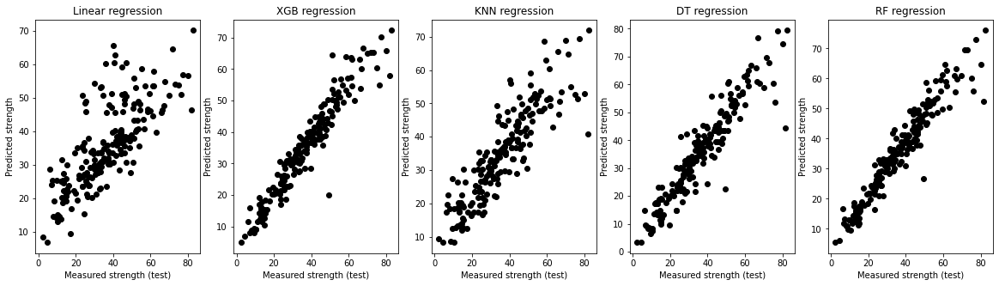

In [92]:
fig, ax = plt.subplots(2, 2, figsize=(20,5))
plt.subplot(1, 5, 1)
plt.plot(y_test, y_pred, 'o',color="black")
plt.title("Linear regression")
plt.xlabel("Measured strength (test)")
plt.ylabel("Predicted strength")
plt.subplot(1, 5, 2)
plt.plot(y_test, y_pred_XGB, 'o',color="black")
plt.title("XGB regression")
plt.xlabel("Measured strength (test)")
plt.ylabel("Predicted strength")
plt.subplot(1, 5, 3)
plt.plot(y_test, y_pred_KNNReg, 'o',color="black")
plt.title("KNN regression")
plt.xlabel("Measured strength (test)")
plt.ylabel("Predicted strength")
plt.subplot(1, 5, 4)
plt.plot(y_test, y_pred_DTReg, 'o',color="black")
plt.title("DT regression")
plt.xlabel("Measured strength (test)")
plt.ylabel("Predicted strength")
plt.subplot(1, 5, 5)
plt.plot(y_test, y_pred_RFReg, 'o',color="black")
plt.title("RF regression")
plt.xlabel("Measured strength (test)")
plt.ylabel("Predicted strength")
plt.show()



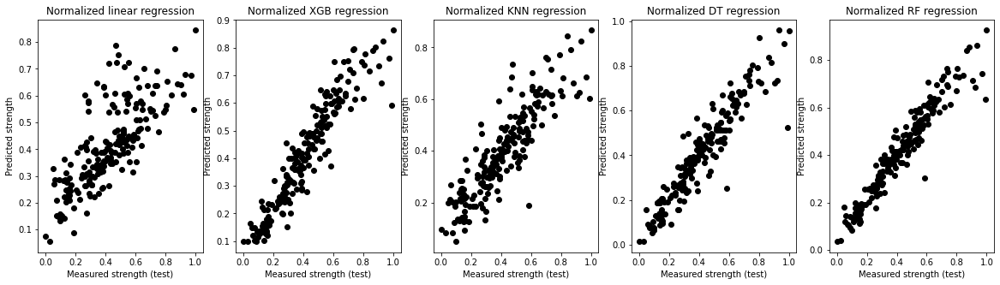

In [93]:
fig, ax = plt.subplots(2, 2, figsize=(20,5))
plt.subplot(1, 5, 1)
plt.plot(y_test_norm, y_pred_norm, 'o',color="black")
plt.title("Normalized linear regression")
plt.xlabel("Measured strength (test)")
plt.ylabel("Predicted strength")
plt.subplot(1, 5, 2)
plt.plot(y_test_norm, y_pred_XGB_norm, 'o',color="black")
plt.title("Normalized XGB regression")
plt.xlabel("Measured strength (test)")
plt.ylabel("Predicted strength")
plt.subplot(1, 5, 3)
plt.plot(y_test_norm, y_pred_KNNReg_norm, 'o',color="black")
plt.title("Normalized KNN regression")
plt.xlabel("Measured strength (test)")
plt.ylabel("Predicted strength")
plt.subplot(1, 5, 4)
plt.plot(y_test_norm, y_pred_DTReg_norm, 'o',color="black")
plt.title("Normalized DT regression")
plt.xlabel("Measured strength (test)")
plt.ylabel("Predicted strength")
plt.subplot(1, 5, 5)
plt.plot(y_test_norm, y_pred_RFReg_norm, 'o',color="black")
plt.title("Normalized RF regression")
plt.xlabel("Measured strength (test)")
plt.ylabel("Predicted strength")
plt.show()

#### Classification plots

#### Plotter to plot the dot size according to the frequency of occurrence

In [94]:
def classificationplotter(real, estimation):
    res_list = []
    for item in zip(real, estimation): 
        if item not in res_list: 
            res_list.append(item) 
    counter=[]
    for i,k in enumerate(res_list):
        counter.append(1)
        if k[0]==k[1]:
            for j in zip(y_test_class, y_pred_class):
                if j==k:
                    counter[i]+= 1
    counter = [x * 100 for x in counter]
    real, estimation = zip(*res_list)
    return real, estimation, counter
    

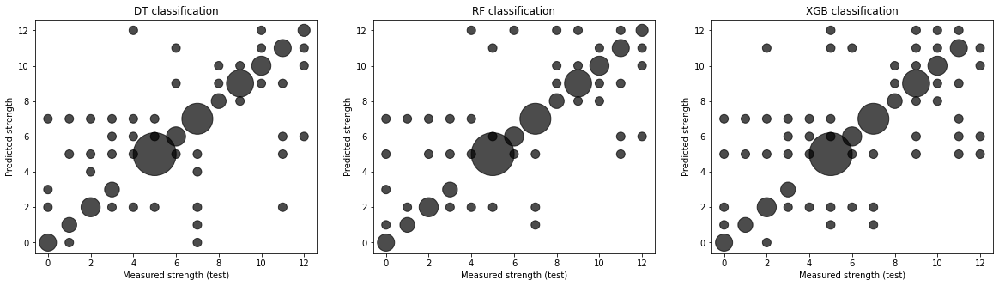

In [95]:
fig, ax = plt.subplots(2, 2, figsize=(20,5))
plt.subplot(1, 3, 1)
y_real_class, y_dt_class_pred, counter_dt = classificationplotter(y_test_class, y_pred_class)
plt.scatter(y_real_class, y_dt_class_pred, s = counter_dt,color="black", alpha=0.7)
plt.title("DT classification")
plt.xlabel("Measured strength (test)")
plt.ylabel("Predicted strength")
plt.subplot(1, 3, 2)
y_real_class, y_rf_class_pred, counter_rf = classificationplotter(y_test_class, y_pred_RFclass)
plt.scatter(y_real_class, y_rf_class_pred, s = counter_rf,color="black", alpha=0.7)
plt.title("RF classification")
plt.xlabel("Measured strength (test)")
plt.ylabel("Predicted strength")
plt.subplot(1, 3, 3)
y_real_class, y_xgb_class_pred, counter_xgb = classificationplotter(y_test_class, y_pred_xgbclass)
plt.scatter(y_real_class, y_xgb_class_pred, s = counter_xgb,color="black", alpha=0.7)
plt.title("XGB classification")
plt.xlabel("Measured strength (test)")
plt.ylabel("Predicted strength")
plt.show()

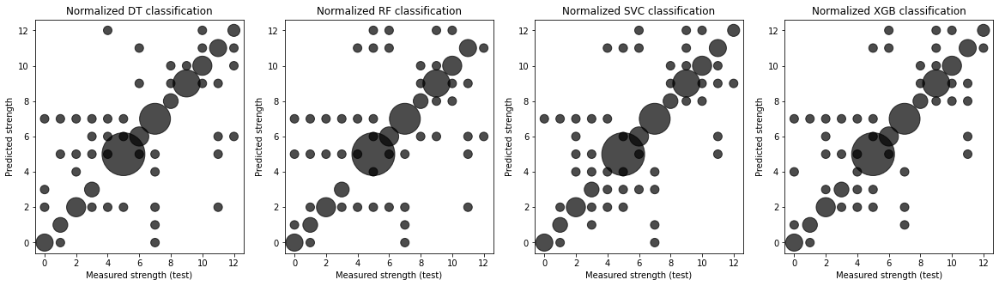

In [96]:
fig, ax = plt.subplots(2, 2, figsize=(20,5))
plt.subplot(1, 4, 1)
y_real_class_norm, y_dt_class_pred_norm, counter_dt_norm = classificationplotter(y_test_class_norm, y_pred_class_norm)
plt.scatter(y_real_class_norm, y_dt_class_pred_norm, s = counter_dt_norm,color="black", alpha=0.7)
plt.title("Normalized DT classification")
plt.xlabel("Measured strength (test)")
plt.ylabel("Predicted strength")
plt.subplot(1, 4, 2)
y_real_class_norm, y_rf_class_pred_norm, counter_rf_norm = classificationplotter(y_test_class_norm, y_pred_RFclass_norm)
plt.scatter(y_real_class_norm, y_rf_class_pred_norm, s = counter_rf_norm,color="black", alpha=0.7)
plt.title("Normalized RF classification")
plt.xlabel("Measured strength (test)")
plt.ylabel("Predicted strength")
plt.subplot(1, 4, 3)
y_real_class_norm, y_svc_class_pred_norm, counter_svc_norm = classificationplotter(y_test_class_norm, y_pred_SVclass_norm)
plt.scatter(y_real_class_norm, y_svc_class_pred_norm, s = counter_svc_norm,color="black", alpha=0.7)
plt.title("Normalized SVC classification")
plt.xlabel("Measured strength (test)")
plt.ylabel("Predicted strength")
plt.subplot(1, 4, 4)
y_real_class_norm, y_xgb_class_pred_norm, counter_xgb_norm = classificationplotter(y_test_class_norm, y_pred_xgbclass_norm)
plt.scatter(y_real_class_norm, y_xgb_class_pred_norm, s = counter_xgb_norm,color="black", alpha=0.7)
plt.title("Normalized XGB classification")
plt.xlabel("Measured strength (test)")
plt.ylabel("Predicted strength")
plt.show()

### The best regression model

The best regression model based on its metrics is <b>Random Forest regression</b>. It has a very high R2 value, which shows that is most cases this model fits well to the real world data. The absolute errors are quite low. It means that the model can estimate accurately the real world data. 

In [97]:
print('Mean Absolute Error (MAE):'), print(round(MAE_RFReg,2))
print('Mean Squared Error (MSE):'), print(round(MSE_RFReg,2))
print('Root Mean Square Error (RMSE):'), print(round(RMSE_RFReg,2))
print('R Squared (R²):'), print(round(R2_RFReg,2))
print('Adjusted R² Score (AdjR²):'), print(round(adj_R2_RFReg,2))
print('Akaike Information Criterion (AIC):'), print(round(AIC_RFreg,2))
print('Bayesian Information Criterion (BIC):'), print(round(BIC_RFreg,2))

Mean Absolute Error (MAE):
3.45
Mean Squared Error (MSE):
26.24
Root Mean Square Error (RMSE):
5.12
R Squared (R²):
0.91
Adjusted R² Score (AdjR²):
0.91
Akaike Information Criterion (AIC):
680.72
Bayesian Information Criterion (BIC):
720.36


(None, None)

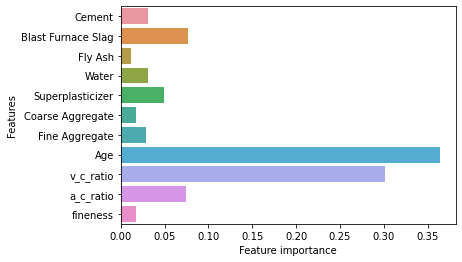

In [98]:
ax = sns.barplot(x=RFRegressor.feature_importances_, y=RFRegressor.feature_names_in_)
ax.set(xlabel='Feature importance', ylabel='Features')
plt.show()

As the above barplot shows the most important features are Age, v/c ratio (which is a calculated parameter, based on Water and Cement). The others have much lower effect on the result. Among them maybe the a/c ratio (calculated value based on the amount of aggregates and cement) and the amount of Blast Furnace slag can be considered as somewhat significant. 
Fly ash, Coarse aggregate and the fineness are negligible. 
This somewhat correlates with the literature. Besides the age, the v/c ratio is the most important feature that influences the concrete strength. It is nicely shown as well that Fly ash has no effect on the strength, which correlates with the literature data. However, in the literature the fineness is an important factor as well, which is almost irrelevant here.

### The best classification model

The best classification model based on its metrics is normalized <b>XGB classification</b>.

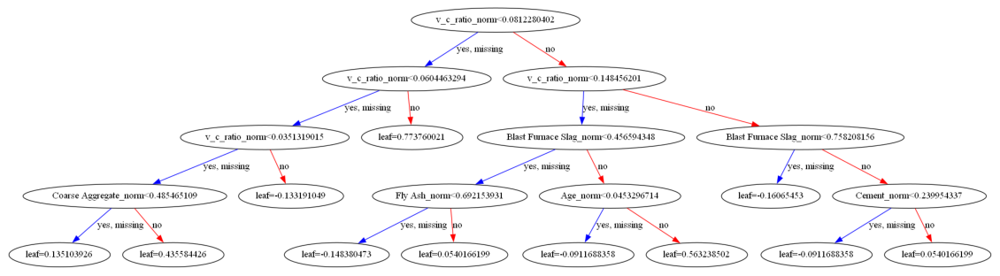

In [100]:
xgb.plot_tree(XGBClassifer_norm ,num_trees=0)
fig = plt.gcf()
fig.set_size_inches(20, 12)

On the above figure it can be seen that the dataset is split based on the v/c ratio first, thus it can be considered as one of the most important features. This correlates with the literature, which says that at a given age the concrete strength is mostly influenced by its v/c ratio.  

<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

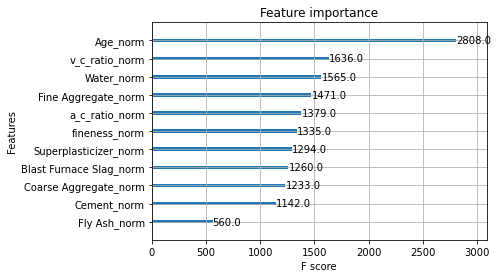

In [101]:
xgb.plot_importance(XGBClassifer_norm)

Based on the above figure it can be seen that the Age is the most important feature, while Fly Ash is the least important. The others inbetween all have some effect. 

Results for XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, gamma=None,
              gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, predictor=None, random_state=None,
              reg_alpha=None, reg_lambda=None, ..
Accuracy score: 0.5074626865671642
Precision score: [0.83333333 0.63636364 0.27272727 0.66666667 0.4        0.48717949
 0.55555556 0.57692308 0.57142857 0.53333333 0.33333333 0.55555556
 0.30769231]
Average precision score: 0.5176993946224715
Recall

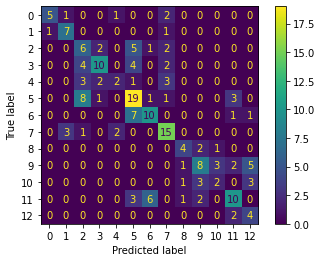

AUC: 0.8518518518518519


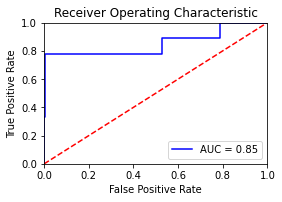

AUC: 0.9681712962962963


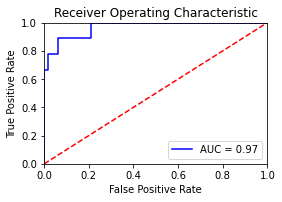

AUC: 0.8567567567567568


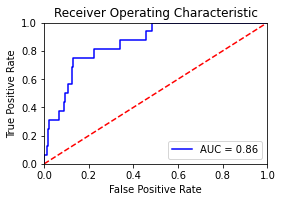

AUC: 0.8569060773480662


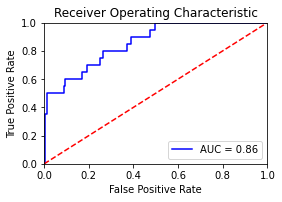

AUC: 0.6813397129186602


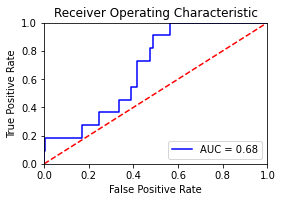

AUC: 0.8759018759018758


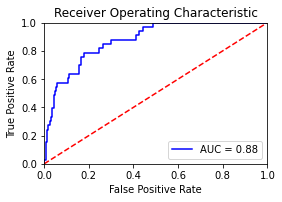

AUC: 0.8441295546558705


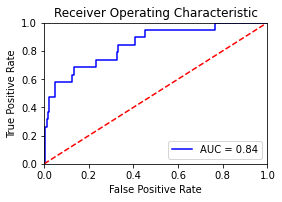

AUC: 0.8814814814814814


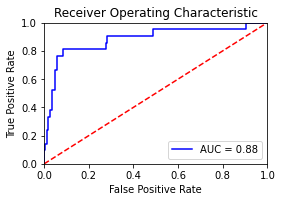

AUC: 0.9285714285714286


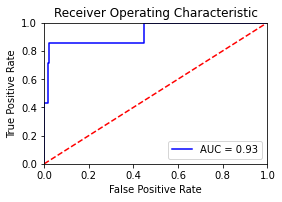

AUC: 0.9138230190861769


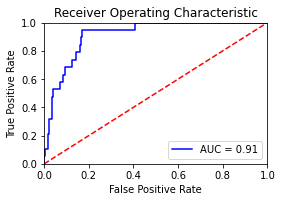

AUC: 0.8616898148148148


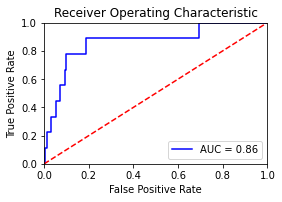

AUC: 0.8905535804977145


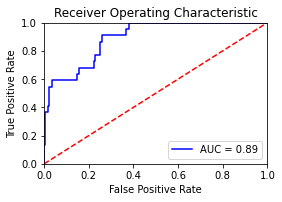

AUC: 0.9538461538461539


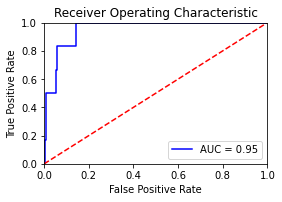

Average AUC: 0.8742325080020883


In [102]:
AS_XGBnorm, PS_XGBnorm, APS_XGBnorm, RS_XGBnorm, ARS_XGBnorm, F1_XGBnorm, AF1_XGBnorm, CM_XGBnorm, FPR_XGBnorm, AFPR_XGBnorm, TPR_XGBnorm, ATPR_XGBnorm, roc_auc_XGBnorm, av_roc_auc_XGBnorm = evaluator_class(XGBClass_norm, XGBClassifer_norm, y_train_class_norm, y_pred_xgbclass_norm, X_train_class_norm, X_test_class_norm, y_test_class_norm)

An average AUC above 80% can be considered as a strong classifier, however all other metrics are not that high. Accuracy score is quite low, F1 value is an OK quality. TPR is not that high and the FPR is a bit too high. Thus in my opinion it is still not an acceptable classifier.  

In [103]:
classificationmethods = [
        ["Normalized XG boost classification", AS_XGBnorm, APS_XGBnorm, ARS_XGBnorm, AF1_XGBnorm, AFPR_XGBnorm, ATPR_XGBnorm, av_roc_auc_XGBnorm]
        ]
#define header names
col_names_class = ["Classification method", "AS", "APS", "ARS", "AF1", "AFPR", "ATPR", "Average Roc AUC"]
  
#display table
print(tabulate(classificationmethods, headers=col_names_class, tablefmt="fancy_grid", showindex='always',floatfmt=".2f"))

╒════╤════════════════════════════════════╤══════╤═══════╤═══════╤═══════╤════════╤════════╤═══════════════════╕
│    │ Classification method              │   AS │   APS │   ARS │   AF1 │   AFPR │   ATPR │   Average Roc AUC │
╞════╪════════════════════════════════════╪══════╪═══════╪═══════╪═══════╪════════╪════════╪═══════════════════╡
│  0 │ Normalized XG boost classification │ 0.51 │  0.52 │  0.50 │  0.50 │   0.13 │   0.53 │              0.87 │
╘════╧════════════════════════════════════╧══════╧═══════╧═══════╧═══════╧════════╧════════╧═══════════════════╛


In [104]:
print(classification_report(y_test_class_norm, y_pred_xgbclass_norm))

              precision    recall  f1-score   support

           0       0.83      0.56      0.67         9
           1       0.64      0.78      0.70         9
           2       0.27      0.38      0.32        16
           3       0.67      0.50      0.57        20
           4       0.40      0.18      0.25        11
           5       0.49      0.58      0.53        33
           6       0.56      0.53      0.54        19
           7       0.58      0.71      0.64        21
           8       0.57      0.57      0.57         7
           9       0.53      0.42      0.47        19
          10       0.33      0.22      0.27         9
          11       0.56      0.45      0.50        22
          12       0.31      0.67      0.42         6

    accuracy                           0.51       201
   macro avg       0.52      0.50      0.50       201
weighted avg       0.52      0.51      0.50       201



With the help of the above models one can predict the strength of the hardened concrete based on its mix composition. It is quite useful for material technologiest (concrete technologists). In usual cases concrete technologists receive an expected strength or strength class from the designers (structural engineers) and they have to design an appropriate concrete mix. With the help of this model they can easily test what would be the strength/strength class of a mix. (The mix composition is influenced by other factors as well, like cost, environmental class, corrosion resistance.)
Based on the results the accuracy of the best regression model is close to acceptable, however the classification models should be improved more. Most probably with further parameter tuning (especially in case of XGBoost methods) somewhat better performance could be reached. Another option for performance improvement would be to cut the dataset into 3 parts based on the strength (low strength concrete, normal strength concrete and high strength concrete), becasuse it is known from the literature that these work physically in a different way.